In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
import pandas as pd
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from joblib import Parallel, delayed
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, FIGURE_DIR
from avgn.utils.general import save_fig

In [4]:
DATASET_ID = 'koumura_bengalese_finch'
embeddings_dfs = list(DATA_DIR.glob('bf_label_dfs/'+DATASET_ID+'/*.pickle'))
DATASET_ID = 'bengalese_finch_sober'
embeddings_dfs = embeddings_dfs + list(DATA_DIR.glob('bf_label_dfs/'+DATASET_ID+'/*.pickle'))

In [5]:

save_folder = 'hdbscan_labels_num'
HDBSCAN_locs = list(DATA_DIR.glob('HMM_fits/'+save_folder+'/HDBSCAN/*.pickle'))
FOMM_locs = list(DATA_DIR.glob('HMM_fits/FOMM/*.pickle'))

In [6]:
HDBSCAN_locs

[PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird3.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/gy6or6.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird1.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/bl26lb16.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird7.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird5.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird8.pickle'),
 PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/HMM_fits/hdbscan_labels_num/HDBSCAN/Bird6.pickle'),
 PosixPath('/mnt/cube/tsainb

In [9]:
indvs = [(i.stem, i.parent.stem) for i in embeddings_dfs]
print(indvs)

[('Bird9', 'koumura_bengalese_finch'), ('Bird4', 'koumura_bengalese_finch'), ('Bird10', 'koumura_bengalese_finch'), ('Bird6', 'koumura_bengalese_finch'), ('Bird0', 'koumura_bengalese_finch'), ('Bird2', 'koumura_bengalese_finch'), ('Bird1', 'koumura_bengalese_finch'), ('Bird3', 'koumura_bengalese_finch'), ('Bird5', 'koumura_bengalese_finch'), ('Bird8', 'koumura_bengalese_finch'), ('Bird7', 'koumura_bengalese_finch'), ('bl26lb16', 'bengalese_finch_sober'), ('gy6or6', 'bengalese_finch_sober'), ('or60yw70', 'bengalese_finch_sober'), ('gr41rd51', 'bengalese_finch_sober')]


In [10]:
results_df = pd.DataFrame(columns = [
    'indv',
    'dataset',
    'AIC',
    'BIC',
    'LL',
    'model_type',
    'model',
    'n_params',
    'n_components',
    'n_data'
])

for (indv, dataset) in tqdm(indvs):
    print(indv, dataset)
    # load each model results individually

    
    # FOMM
    FOMM_results = pd.read_pickle(FOMM_locs[np.where(np.array([i.stem for i in FOMM_locs]) == indv)[0][0]])
    results_df.loc[len(results_df)] = [
        indv,
        dataset,
        FOMM_results.iloc[0].aic,
        FOMM_results.iloc[0].bic,
        FOMM_results.iloc[0].pom_log_probability,
        'FOMM',
        FOMM_results.iloc[0].pom_model,
        FOMM_results.iloc[0].n_params,
        len(np.unique(np.concatenate(FOMM_results.iloc[0].seqs_train))),
        FOMM_results.iloc[0].n_data
    ]
    
    # HDBSCAN
    HDBSCAN_results = pd.read_pickle(HDBSCAN_locs[np.where(np.array([i.stem for i in HDBSCAN_locs]) == indv)[0][0]])
    results_df.loc[len(results_df)] = [
        indv,
        dataset,
        HDBSCAN_results.iloc[0].aic,
        HDBSCAN_results.iloc[0].bic,
        HDBSCAN_results.iloc[0].sum_log_prob,
        'HDBSCAN',
        HDBSCAN_results.iloc[0].pom_model,
        HDBSCAN_results.iloc[0].num_params,
        HDBSCAN_results.iloc[0].n_components,
        HDBSCAN_results.iloc[0].n_data
    ]

Bird9 koumura_bengalese_finch
Bird4 koumura_bengalese_finch
Bird10 koumura_bengalese_finch
Bird6 koumura_bengalese_finch
Bird0 koumura_bengalese_finch
Bird2 koumura_bengalese_finch
Bird1 koumura_bengalese_finch
Bird3 koumura_bengalese_finch
Bird5 koumura_bengalese_finch
Bird8 koumura_bengalese_finch
Bird7 koumura_bengalese_finch
bl26lb16 bengalese_finch_sober
gy6or6 bengalese_finch_sober
or60yw70 bengalese_finch_sober
gr41rd51 bengalese_finch_sober


### markov models

Bird9 koumura_bengalese_finch


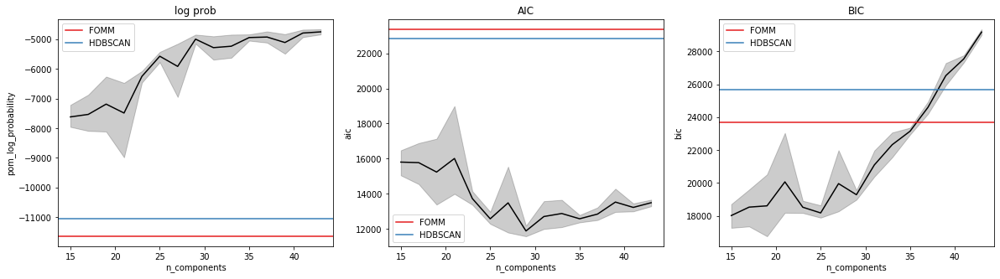

Bird4 koumura_bengalese_finch


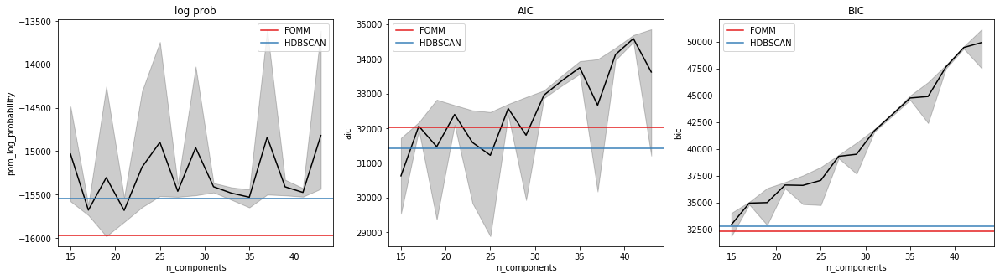

Bird10 koumura_bengalese_finch


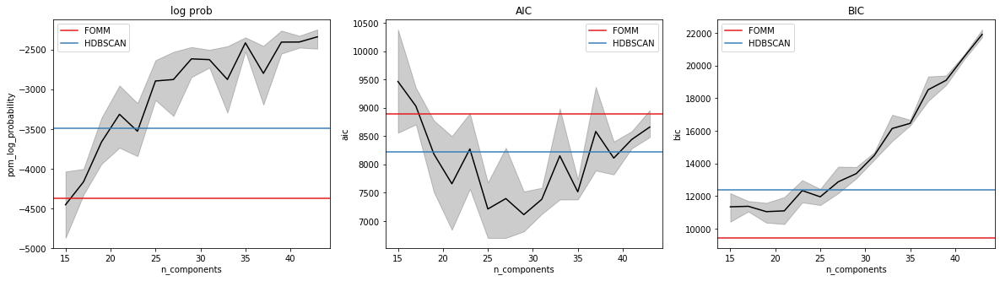

Bird6 koumura_bengalese_finch


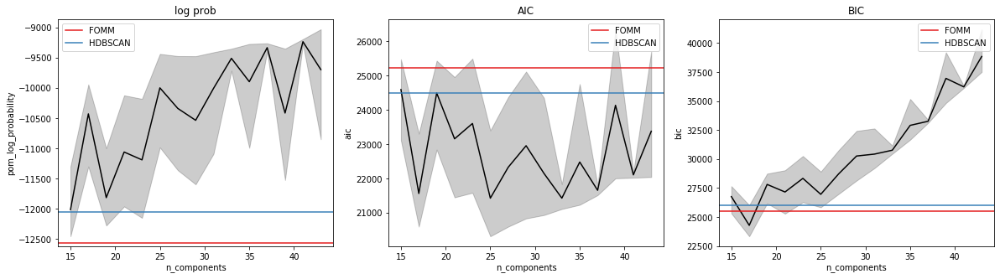

Bird0 koumura_bengalese_finch


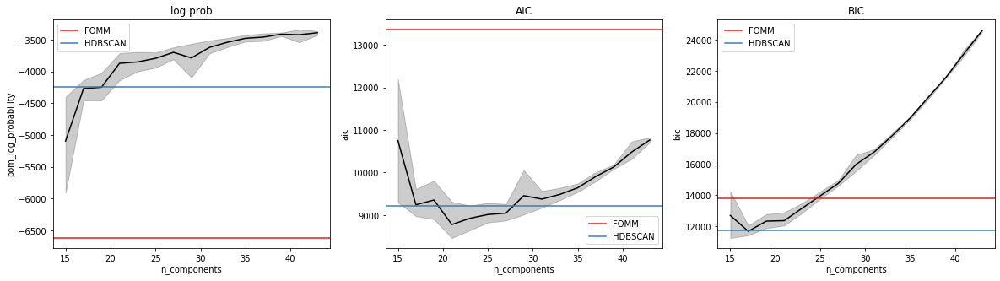

Bird2 koumura_bengalese_finch


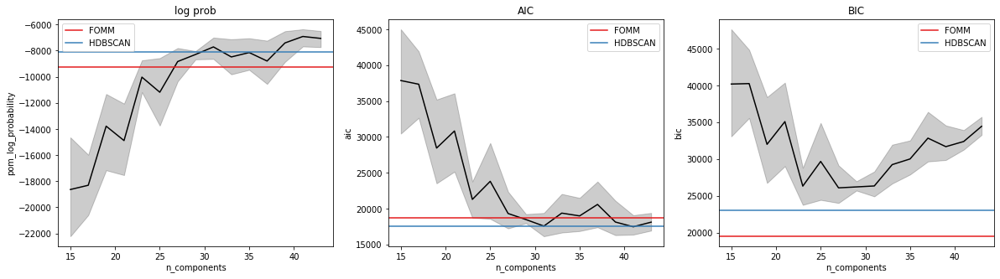

Bird1 koumura_bengalese_finch


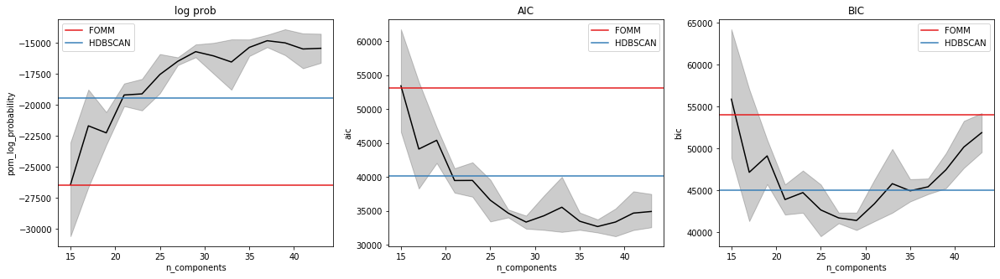

Bird3 koumura_bengalese_finch


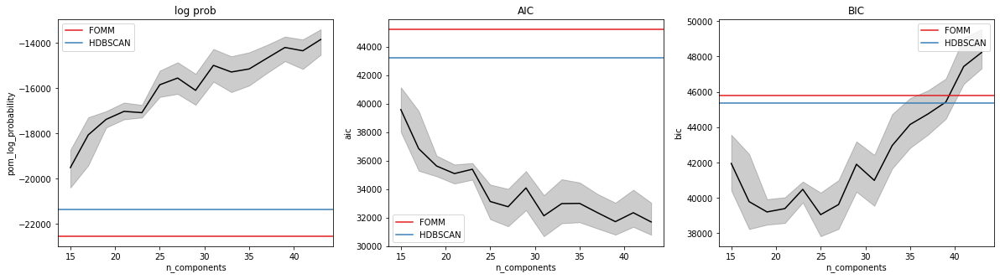

Bird5 koumura_bengalese_finch


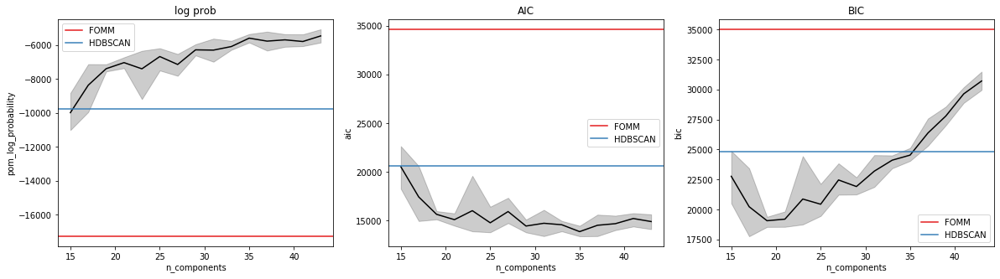

Bird8 koumura_bengalese_finch


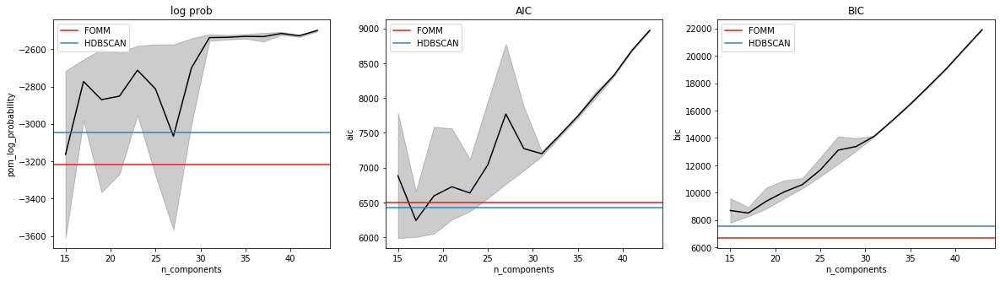

Bird7 koumura_bengalese_finch


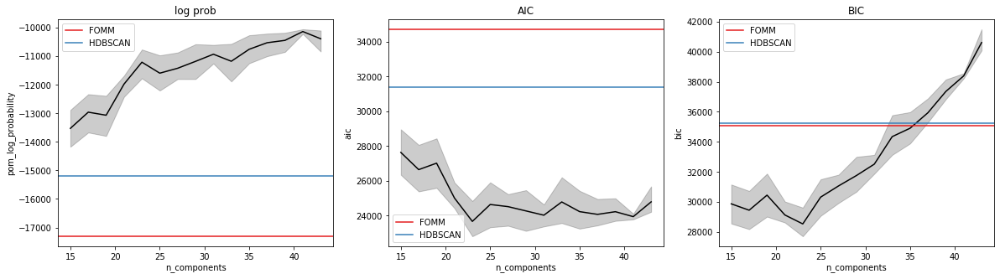

bl26lb16 bengalese_finch_sober


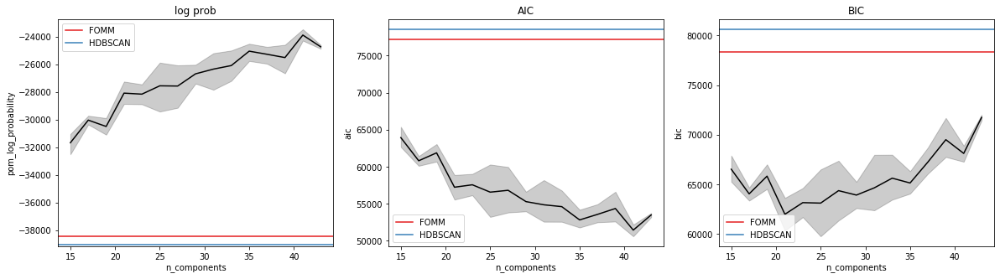

gy6or6 bengalese_finch_sober


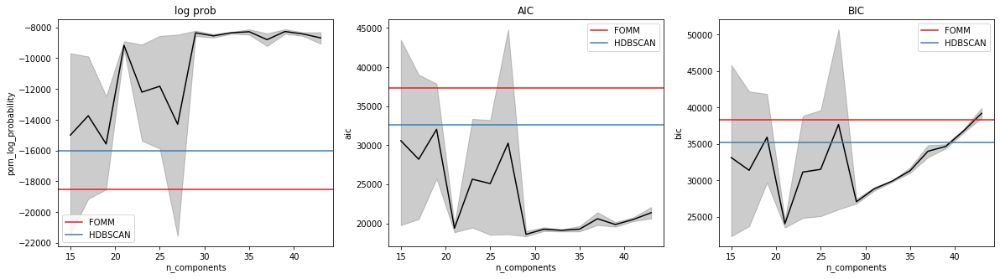

or60yw70 bengalese_finch_sober


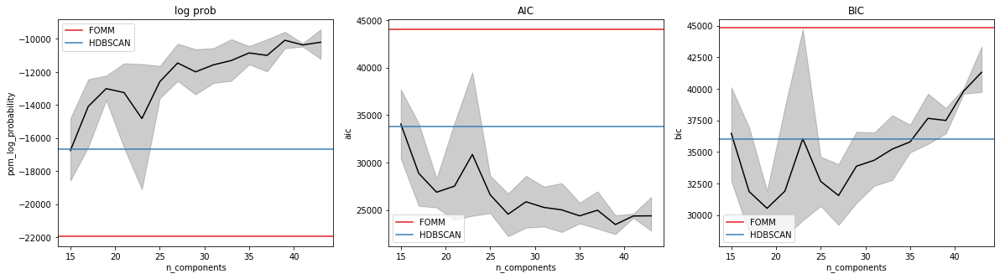

gr41rd51 bengalese_finch_sober


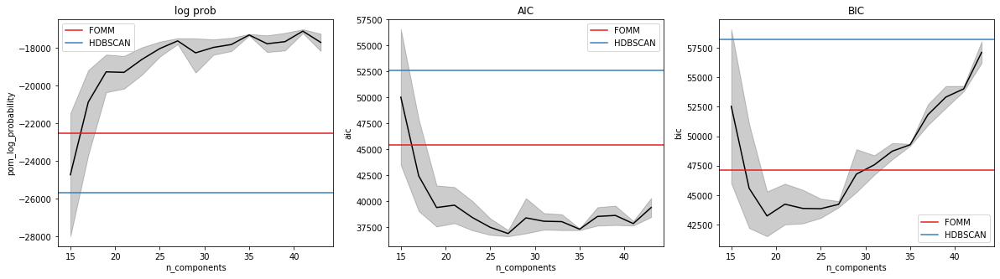

In [13]:
if True:
    HMM_locs = list(DATA_DIR.glob('HMM_fits/HMM/*.pickle'))
    HMM_locs
    best_fit_HMM = {}
    pal = sns.color_palette('Set1', 3)
    for (indv, dataset) in tqdm(indvs):
        print(indv, dataset)

        #
        if len(np.where(np.array([i.stem for i in HMM_locs]) == indv)[0]) == 0 :
            continue

        # load each model results individually
        HMM_results = pd.read_pickle(HMM_locs[np.where(np.array([i.stem for i in HMM_locs]) == indv)[0][0]])
        best_fit = np.argmin(HMM_results.aic.values)
        results_df.loc[len(results_df)] = [
            indv,
            dataset,
            HMM_results.iloc[best_fit].aic,
            HMM_results.iloc[best_fit].bic,
            HMM_results.iloc[best_fit].pom_log_probability,
            'HMM',
            HMM_results.iloc[best_fit].pom_model,
            HMM_results.iloc[best_fit].n_params,
            HMM_results.iloc[best_fit].n_components,
            np.nan,
        ]

        best_fit_HMM[indv] = HMM_results.iloc[best_fit]

        #### For plotting
        indv_aic = {
            X: results_df[(results_df.indv == indv) & (results_df.model_type == X)].AIC.values[
                0
            ]
            for X in ["FOMM",  "HDBSCAN"]
        }
        indv_bic = {
            X: results_df[(results_df.indv == indv) & (results_df.model_type == X)].BIC.values[
                0
            ]
            for X in ["FOMM",  "HDBSCAN"]
        }
        indv_ll = {
            X: results_df[(results_df.indv == indv) & (results_df.model_type == X)].LL.values[
                0
            ]
            for X in ["FOMM", "HDBSCAN"]
        }


        fig, axs = plt.subplots(ncols =3, figsize=(20,5))
        ax = axs[0]
        sns.lineplot(x = "n_components", y = "pom_log_probability",data=HMM_results, ax = ax, color='k')
        for ii, X in enumerate(["FOMM",  "HDBSCAN"]):
            ax.axhline(indv_ll[X], label=X, color = pal[ii])
        ax.set_title('log prob')
        ax.legend()

        ax = axs[1]
        sns.lineplot(x = "n_components", y = "aic", data=HMM_results, ax = ax, color='k')
        ax.set_title('AIC')
        for ii, X in enumerate(["FOMM","HDBSCAN"]):
            ax.axhline(indv_aic[X], label=X, color = pal[ii])
        ax.legend()

        ax = axs[2]
        sns.lineplot(x = "n_components", y = "bic",  data=HMM_results, ax = ax, color='k')
        ax.set_title('BIC')
        for ii, X in enumerate(["FOMM",  "HDBSCAN"]):
            ax.axhline(indv_bic[X], label=X, color = pal[ii])
        ax.legend()
        plt.show()

### relative scores

In [14]:
def zero_one_norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))
def mean_norm(x):
    return (x - np.mean(x)) #/ (np.max(x) - np.min(x))

In [15]:
results_df['norm_LL'] = 0
for indv in results_df.indv.unique():
    results_df.loc[results_df.indv == indv, 'norm_LL'] = mean_norm(results_df[results_df.indv == indv].LL.values) 

In [16]:
results_df['norm_AIC'] = 0
for indv in results_df.indv.unique():
    results_df.loc[results_df.indv == indv, 'norm_AIC'] = mean_norm(results_df[results_df.indv == indv].AIC.values) 

In [17]:
results_df['norm_BIC'] = 0
for indv in results_df.indv.unique():
    results_df.loc[results_df.indv == indv, 'norm_BIC'] = mean_norm(results_df[results_df.indv == indv].BIC.values) 

### PLOT RESULTS

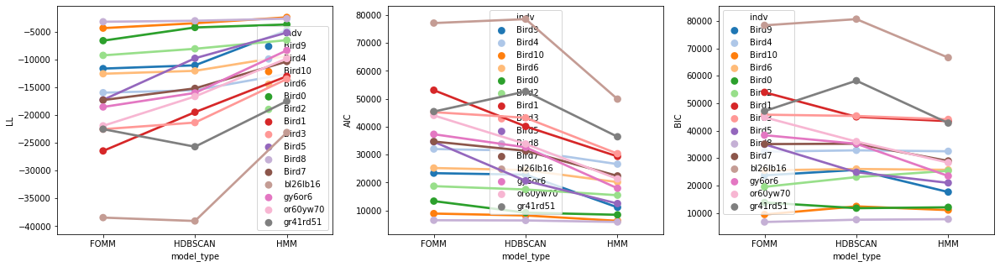

In [18]:
fig, axs = plt.subplots(ncols = 3, figsize=(20,5))
x = sns.catplot(ax = axs[0], x="model_type", y="LL", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df);

x = sns.catplot(ax = axs[1], x="model_type", y="AIC", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df);

x = sns.catplot(ax = axs[2], x="model_type", y="BIC", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df);
plt.close(2)
plt.close(3)
plt.close(4)

In [19]:
order = ['FOMM','HDBSCAN', 'HMM']

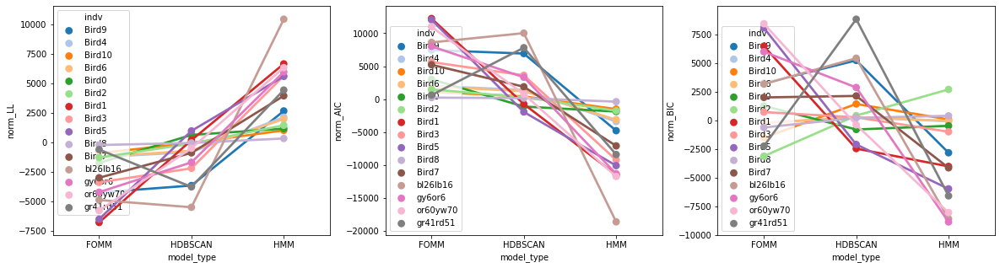

In [20]:
fig, axs = plt.subplots(ncols = 3, figsize=(20,5))
x = sns.catplot(ax = axs[0], x="model_type", y="norm_LL", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df, order=order);

x = sns.catplot(ax = axs[1], x="model_type", y="norm_AIC", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df, order=order);

x = sns.catplot(ax = axs[2], x="model_type", y="norm_BIC", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df, order=order);
plt.close(2)
plt.close(3)
plt.close(4)

In [53]:
order = ['FOMM','HDBSCAN', 'HMM']

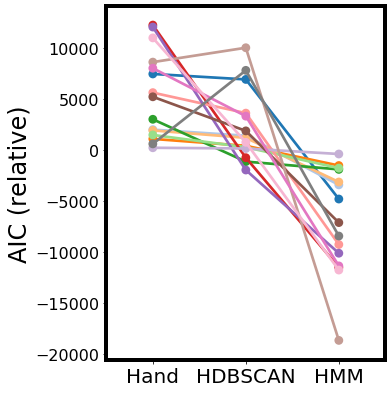

In [74]:
fig, ax = plt.subplots(ncols = 1, figsize=(5,6.5))

x = sns.catplot(ax = ax, x="model_type", y="norm_AIC", hue="indv",# col="dataset",
                kind="point", palette = 'tab20', data=results_df, order=order, legend=False, legend_out=False);
plt.close(2)

ax.set_ylabel("AIC (relative)", fontsize=24)#, weight="bold")
#ax.set_title(("AIC (relative)"), fontsize=24)#, weight="bold")
ax.set_xlabel((""), fontsize=24)
#ax.set_xticklabels(labels = ['Hand ($0^{th}$)', 'HDBSCAN', 'HMM'],  rotation=45, ha='right', fontsize = 22 )#, weight="bold")
ax.set_xticklabels(labels = ['Hand', 'HDBSCAN', 'HMM'],   fontsize = 20 )#, weight="bold")
ax.yaxis.set_tick_params(labelsize=16)
[i.set_linewidth(4) for i in ax.spines.values()]
#ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))

#ax.axhline(0, color='k', ls = 'dashed')
save_loc = FIGURE_DIR / 'bf_sequential_clusters' 
ensure_dir(save_loc)
ax.get_legend().remove()
save_fig(save_loc / "AIC_lines" , dpi=300, save_pdf=True)

In [21]:
pal = 'muted'

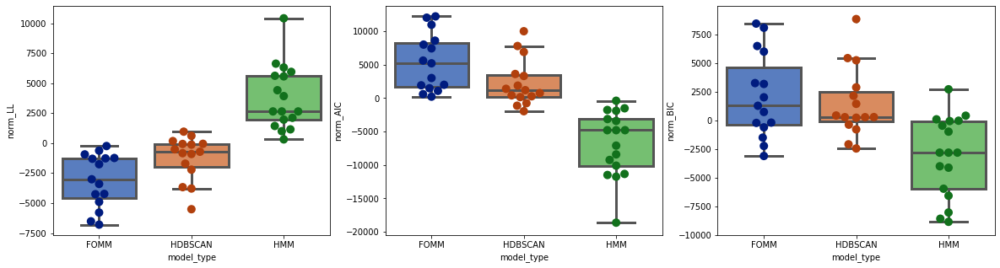

In [22]:
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
for axi, pt in enumerate(['norm_LL', 'norm_AIC', 'norm_BIC']):
    ax = axs[axi]
    x = sns.swarmplot(
        ax=ax,
        x="model_type",
        y=pt,  # col="dataset",
        #color=(0,0,0),
        alpha = 1,
        palette="dark",
        #palette=pal,
        data=results_df,
        order=order,
        size=10,
    )

    sns.boxplot(
        ax=ax,
        x="model_type",
        y=pt,  # col="dataset",
        palette=pal,
        data=results_df,
        order=order,
        # showcaps=False,
        #boxprops={'facecolor':'None'},
        # showfliers=False,
        #whiskerprops={'lw':5},
        #boxprops={'lw':5},
        linewidth=3,
    )  
    plt.close(axi+2)

In [23]:
results_df[:3]

,indv,dataset,AIC,BIC,LL,model_type,model,n_params,n_components,n_data,norm_LL,norm_AIC,norm_BIC
0,Bird9,koumura_bengalese_finch,23368.446449,23683.657253,-11644.223224,FOMM,"None:{\n ""class"" : ""State"",\n ""distribut...",40,6,19541,-4260.947944,7453.895888,3245.831653
1,Bird9,koumura_bengalese_finch,22833.080314,25677.857821,-11055.540157,HDBSCAN,"None:{\n ""class"" : ""State"",\n ""distribut...",361,17,19541,-3672.264876,6918.529753,5240.032221
2,Bird4,koumura_bengalese_finch,32020.121853,32323.505089,-15973.060926,FOMM,"None:{\n ""class"" : ""State"",\n ""distribut...",37,5,26891,-1270.757364,2002.848061,-205.563247


In [24]:
import scipy.stats

In [25]:
len(results_df[results_df.model_type == "FOMM"].LL.values)

15

In [26]:
scipy.stats.ttest_rel(
    results_df[results_df.model_type == "FOMM"].LL.values,
    results_df[results_df.model_type == "HDBSCAN"].LL.values,
)

Ttest_relResult(statistic=-2.5538409392490022, pvalue=0.02294580571325926)

In [27]:
np.sum(results_df[results_df.model_type == "HDBSCAN"].LL.values > results_df[results_df.model_type == "FOMM"].LL.values)

13

In [28]:
scipy.stats.ttest_rel(
    results_df[results_df.model_type == "FOMM"].AIC.values,
    results_df[results_df.model_type == "HDBSCAN"].AIC.values,
)

Ttest_relResult(statistic=2.1565991035679737, pvalue=0.04891184476645131)

In [29]:
import matplotlib
matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['font.family'] = "sans-serif"

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


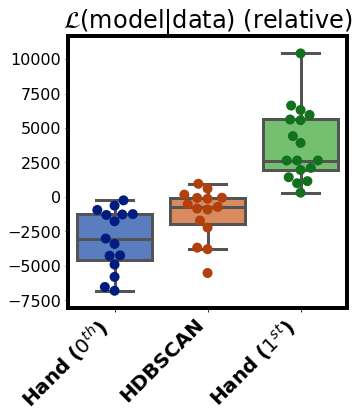

In [30]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.boxplot(
    ax=ax,
    x="model_type",
    y="norm_LL",
    palette=pal,
    data=results_df,
    order=order,
    # showcaps=False,
    # boxprops={'facecolor':'None'},
    # showfliers=False,
    # whiskerprops={'lw':5},
    # boxprops={'lw':5},
    linewidth=3,
)
x = sns.swarmplot(
    ax=ax,
    x="model_type",
    y="norm_LL",  # col="dataset",
    # color=(0,0,0),
    alpha=1,
    palette="dark",
    # palette=pal,
    data=results_df,
    order=order,
    size=10,
)
ax.set_ylabel((""), fontsize=24)  # , weight="bold")
ax.set_title(
    ("$\mathcal{L}$(model|data) (relative)"), fontsize=24, fontname="Arial"
)  #, weight="bold")
ax.set_xlabel((""), fontsize=24)
ax.set_xticklabels(
    labels=["Hand ($0^{th}$)", "HDBSCAN", "Hand ($1^{st}$)", "HMM"],
    rotation=45,
    ha="right",
    fontsize=20,
  weight="bold")
ax.yaxis.set_tick_params(labelsize=16)
[i.set_linewidth(4) for i in ax.spines.values()]


save_loc = FIGURE_DIR / "bf_sequential_clusters"
ensure_dir(save_loc)
#save_fig(save_loc / "likelihood", dpi=300, save_pdf=True)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


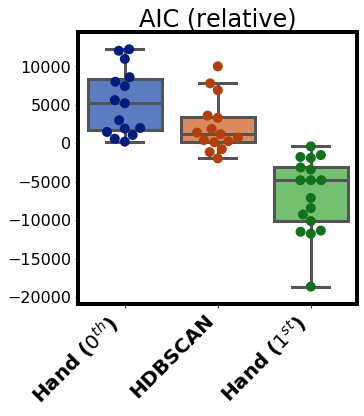

In [31]:
import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(
    ax=ax,
    x="model_type",
    y='norm_AIC', 
    palette=pal,
    data=results_df,
    order=order,
    # showcaps=False,
    #boxprops={'facecolor':'None'},
    # showfliers=False,
    #whiskerprops={'lw':5},
    #boxprops={'lw':5},
    linewidth=3,
)
x = sns.swarmplot(
    ax=ax,
    x="model_type",
    y="norm_AIC",  # col="dataset",
    #color=(0,0,0),
    alpha = 1,
    palette="dark",
    #palette=pal,
    data=results_df,
    order=order,
    size=10,
)
ax.set_ylabel("", fontsize=24)#, weight="bold")
ax.set_title(("AIC (relative)"), fontsize=24)#, weight="bold")
ax.set_xlabel((""), fontsize=24)
ax.set_xticklabels(labels = ['Hand ($0^{th}$)', 'HDBSCAN', 'Hand ($1^{st}$)', 'HMM'],  rotation=45, ha='right', fontsize = 20 , weight="bold")
ax.yaxis.set_tick_params(labelsize=16)
[i.set_linewidth(4) for i in ax.spines.values()]
#ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))


save_loc = FIGURE_DIR / 'bf_sequential_clusters' 
ensure_dir(save_loc)
#save_fig(save_loc / "AIC" , dpi=300, save_pdf=True)

In [ ]:
import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(
    ax=ax,
    x="model_type",
    y='norm_AIC', 
    palette=pal,
    data=results_df,
    order=order,
    # showcaps=False,
    #boxprops={'facecolor':'None'},
    # showfliers=False,
    #whiskerprops={'lw':5},
    #boxprops={'lw':5},
    linewidth=3,
)
x = sns.swarmplot(
    ax=ax,
    x="model_type",
    y="norm_AIC",  # col="dataset",
    #color=(0,0,0),
    alpha = 1,
    palette="dark",
    #palette=pal,
    data=results_df,
    order=order,
    size=10,
)
ax.set_ylabel("", fontsize=24)#, weight="bold")
ax.set_title(("AIC (relative)"), fontsize=24)#, weight="bold")
ax.set_xlabel((""), fontsize=24)
ax.set_xticklabels(labels = ['Hand ($0^{th}$)', 'HDBSCAN', 'Hand ($1^{st}$)', 'HMM'],  rotation=45, ha='right', fontsize = 20 , weight="bold")
ax.yaxis.set_tick_params(labelsize=16)
[i.set_linewidth(4) for i in ax.spines.values()]
#ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))


save_loc = FIGURE_DIR / 'bf_sequential_clusters' 
ensure_dir(save_loc)
#save_fig(save_loc / "AIC" , dpi=300, save_pdf=True)

### Plot labels
- for each bird, get labelled sequences (FOMM, HDBSCAN and infer HMM). Plot labelled sequences side-by-side.

Bird9


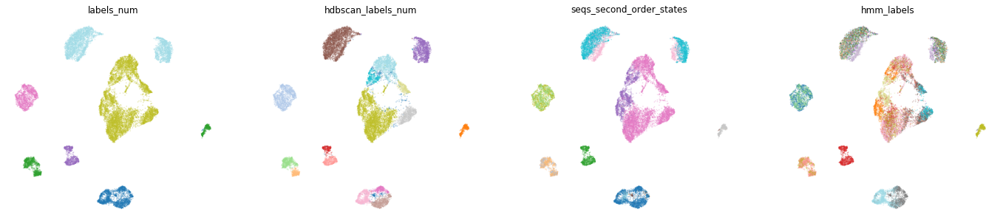

Bird4


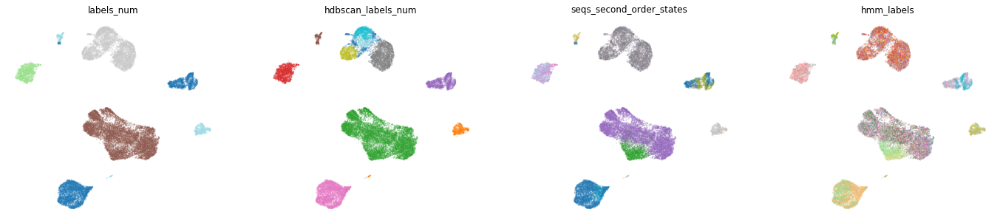

Bird10


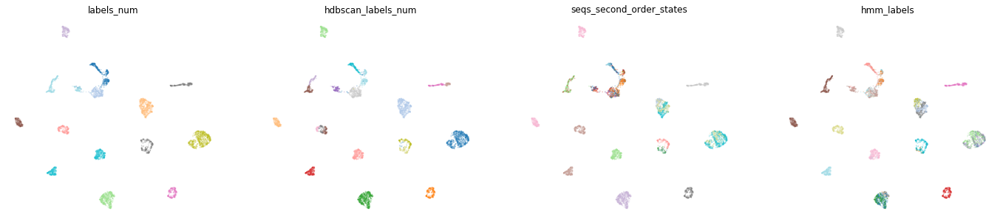

Bird6


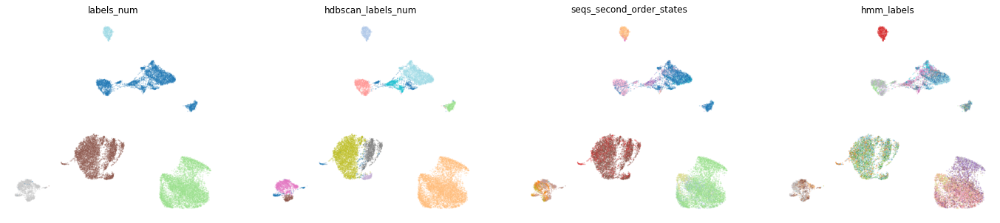

Bird0


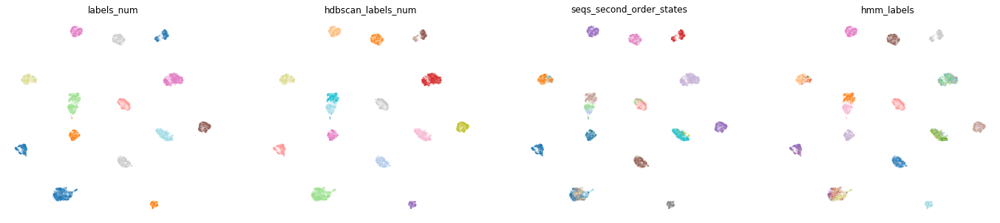

Bird2


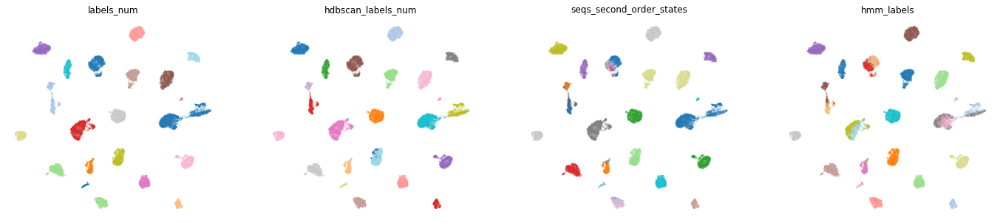

Bird1


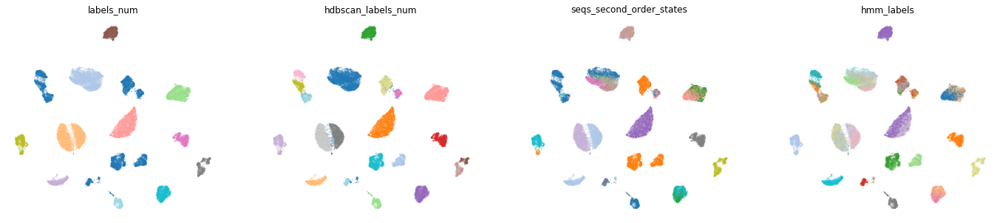

Bird3


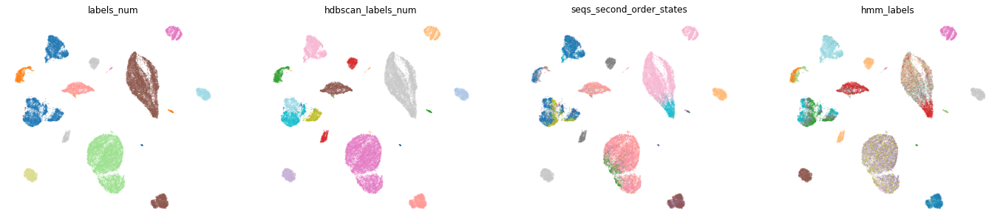

Bird5


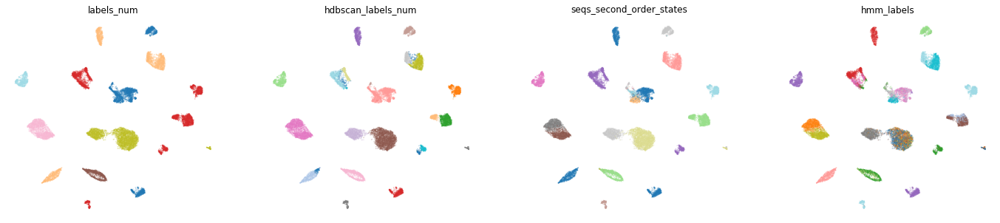

Bird8


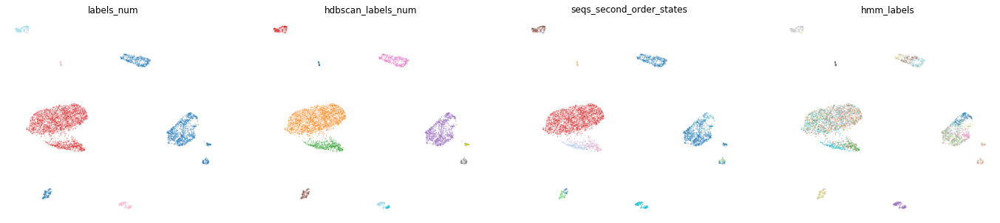

Bird7


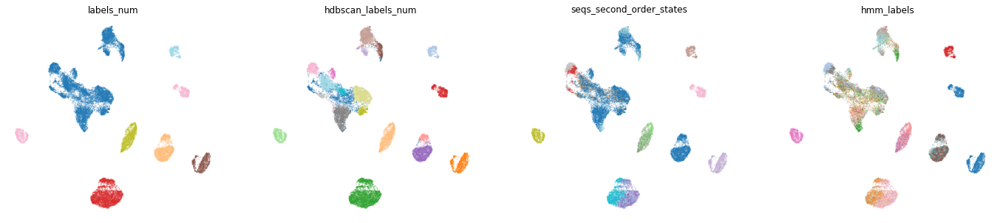

bl26lb16


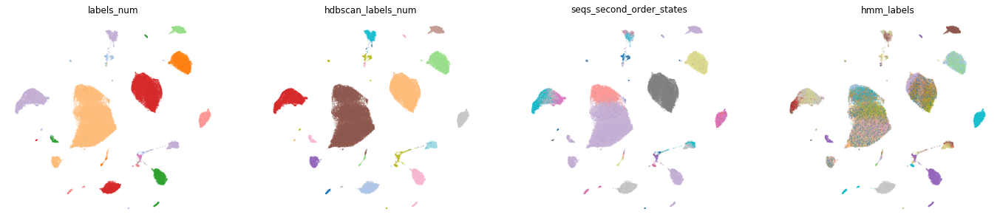

gy6or6


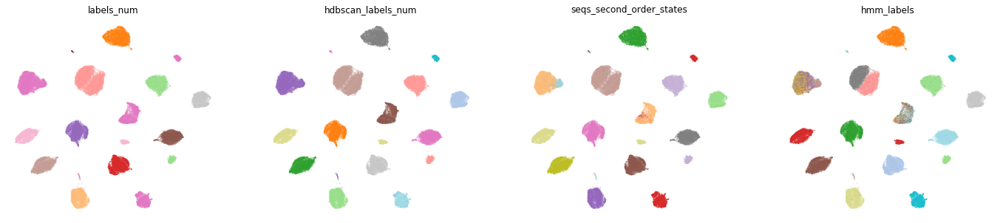

or60yw70


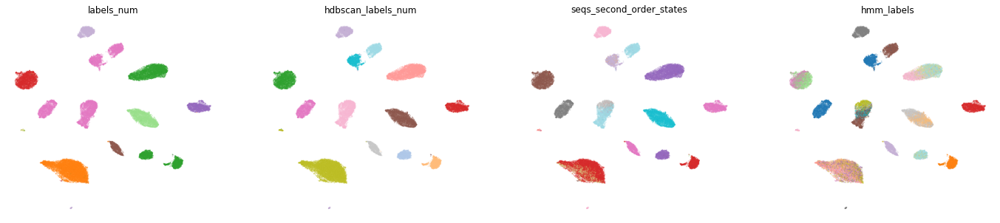

gr41rd51


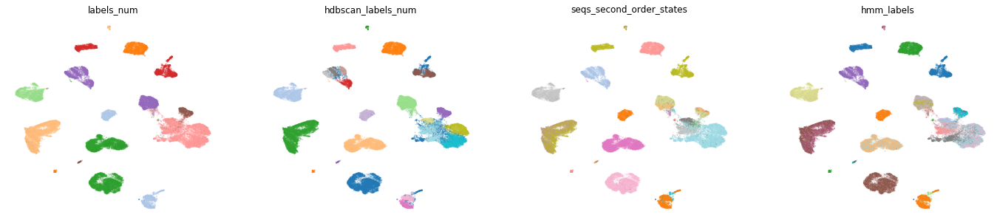

In [26]:
for (indv, dataset) in tqdm(indvs):
    print(indv)
    indv_df = pd.read_pickle(np.array(embeddings_dfs)[np.array([i.stem for i in embeddings_dfs]) == indv][0])
    
    indv_df["hmm_labels"] = np.concatenate(best_fit_HMM[indv]["pom_predictions"])
    
    z = np.vstack(indv_df["umap-0.25"].values)
    
    lab_list = ['labels_num', 'hdbscan_labels_num', 'seqs_second_order_states', 'hmm_labels']
    fig, axs = plt.subplots(ncols=len(lab_list), figsize=(6*len(lab_list),5))
    for i, lab in enumerate(lab_list):
        ax = axs[i]
        ax.scatter(z[:,0], z[:,1], c = indv_df[lab], s = 0.5, cmap = plt.cm.tab20, alpha = 0.25, rasterized=True)
        ax.axis('off')
        ax.set_title(lab)
        
    save_loc = FIGURE_DIR / 'bf_sequential_clusters' 
    ensure_dir(save_loc)
    #save_fig(save_loc / (indv + 'no_border') , dpi=300, save_pdf=True)
        
    plt.show()


In [27]:
from avgn.visualization.projections import scatter_spec, scatter_projections

Bird9


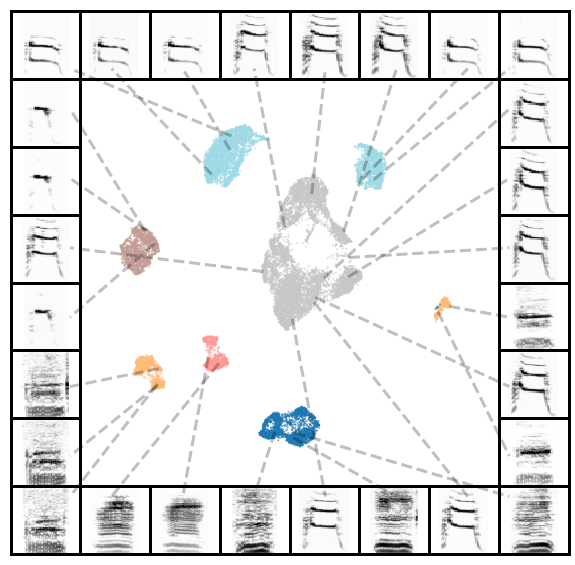

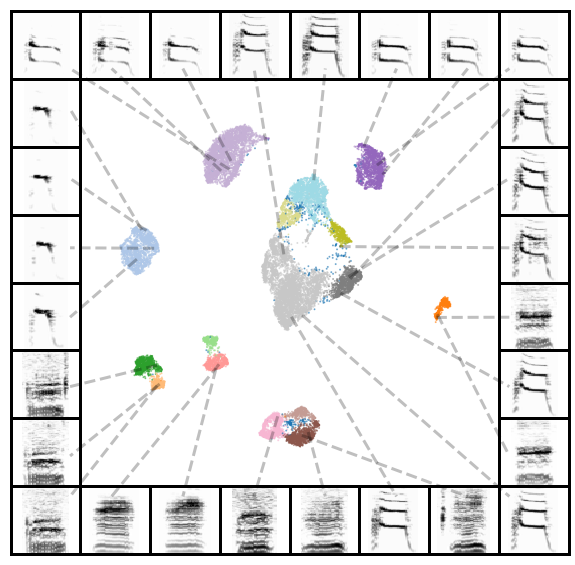

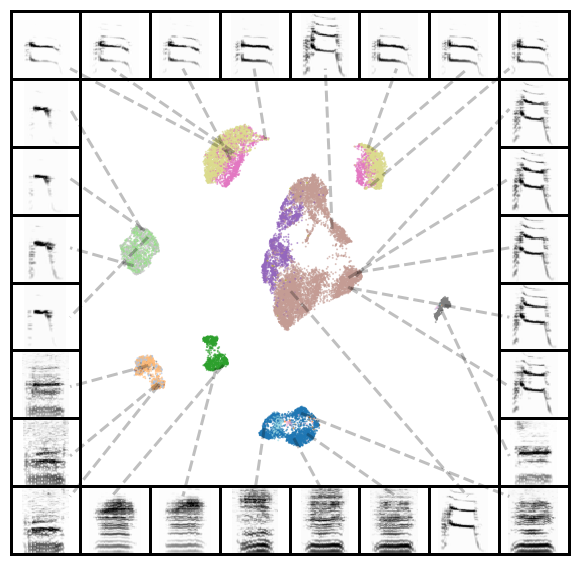

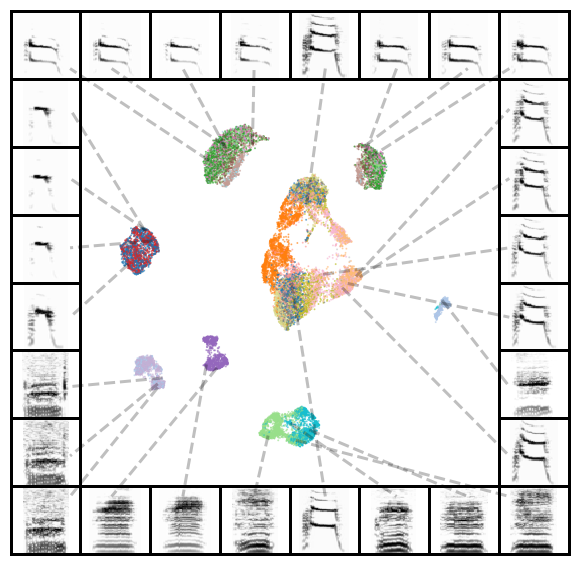

Bird4


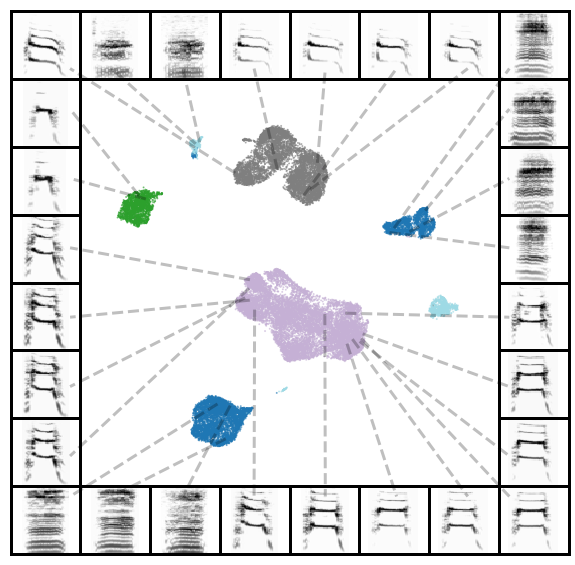

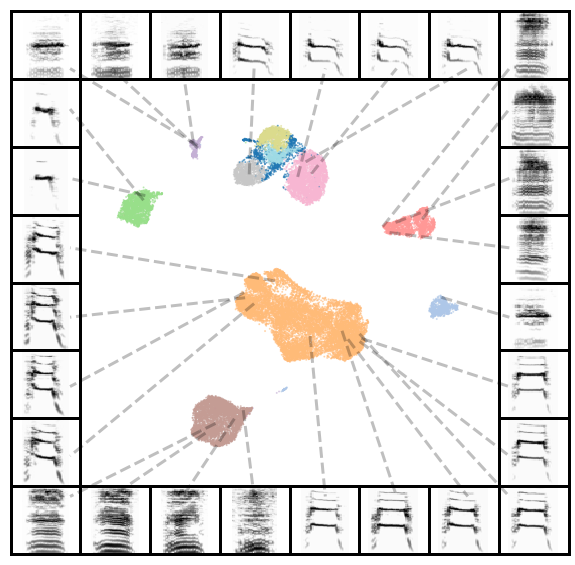

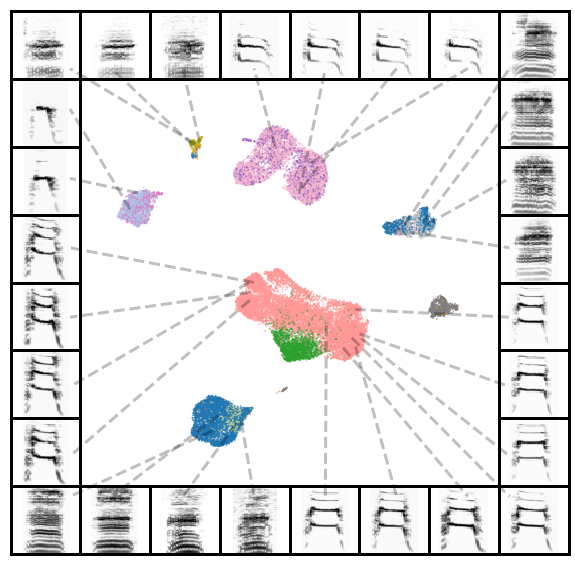

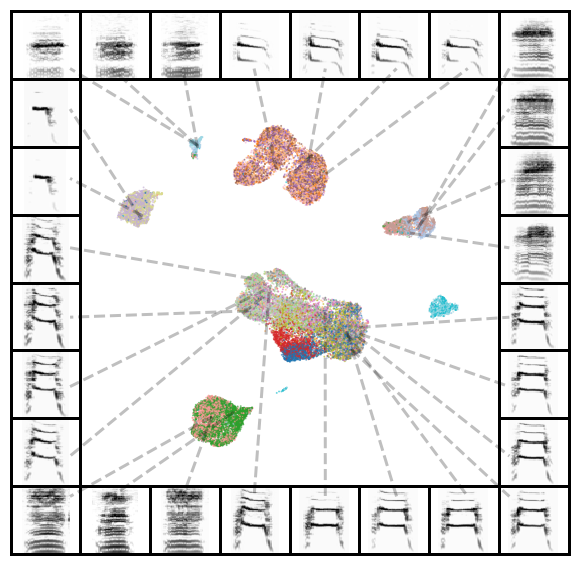

Bird10


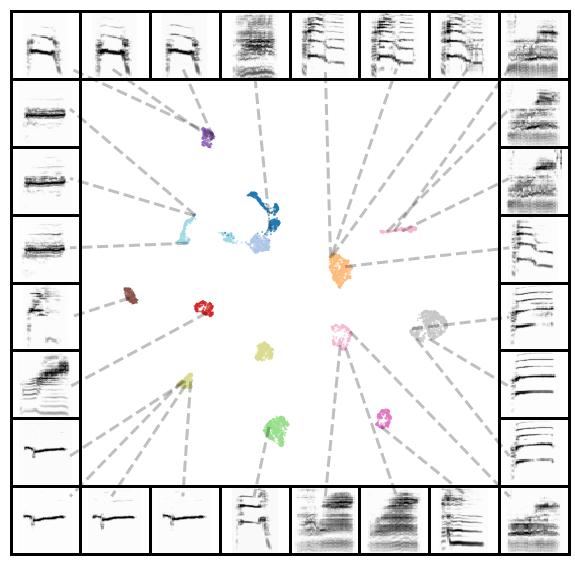

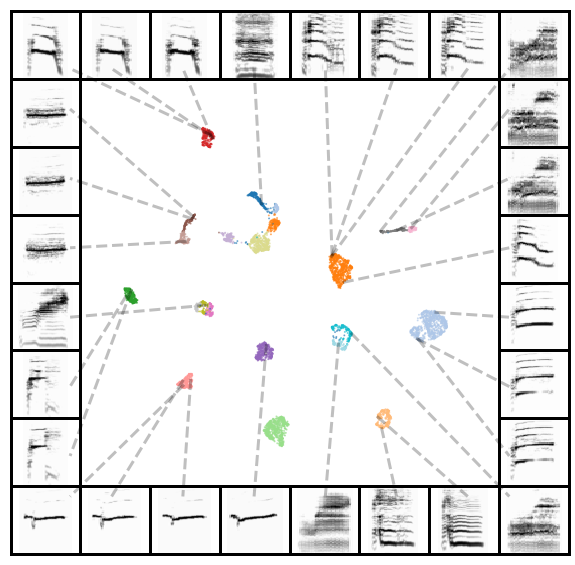

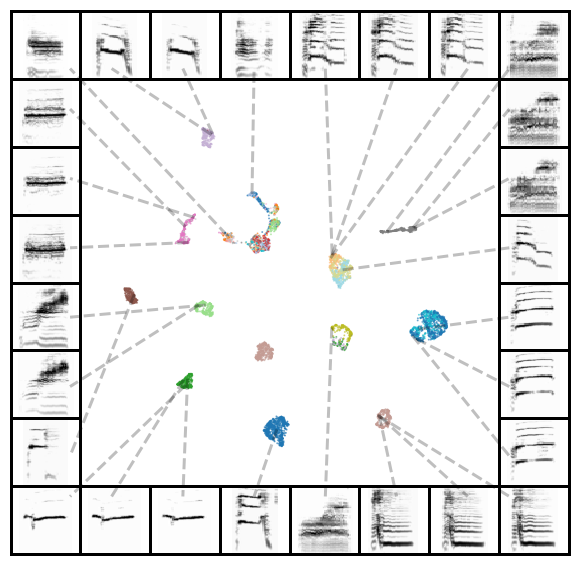

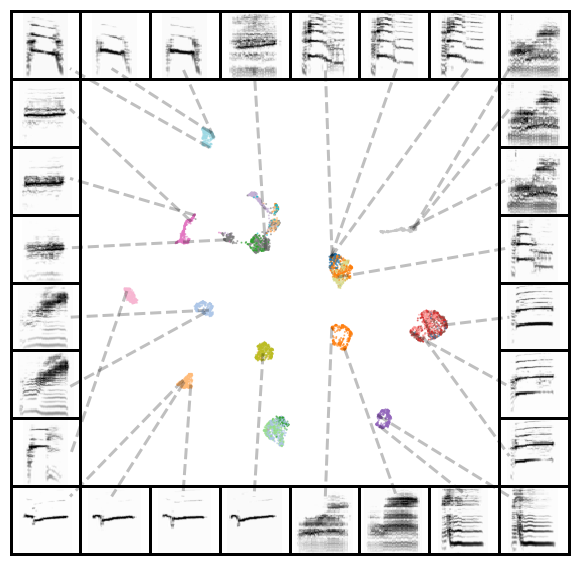

Bird6


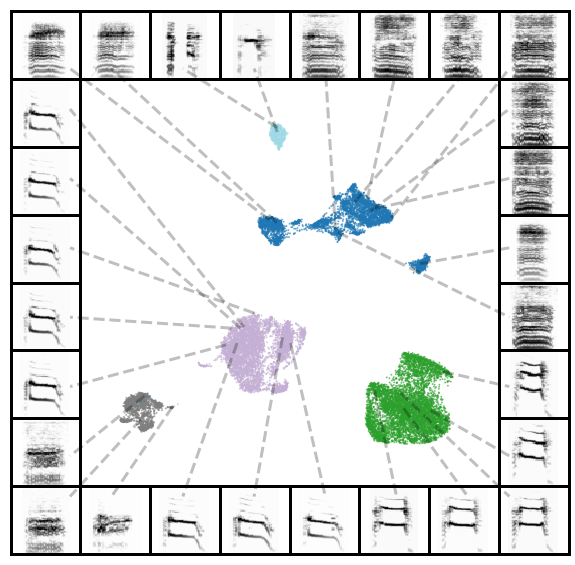

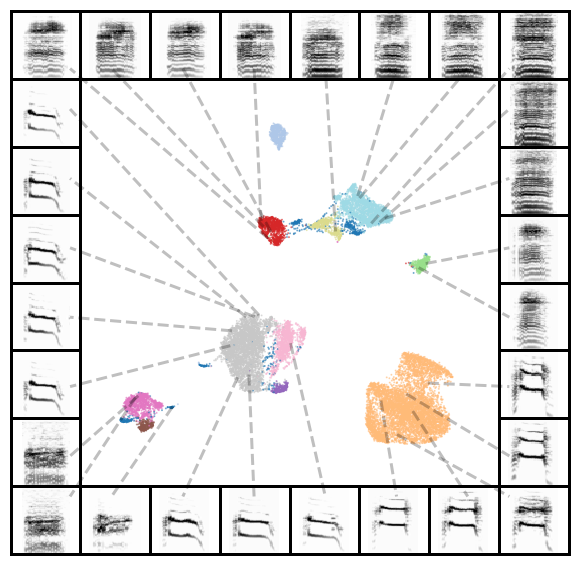

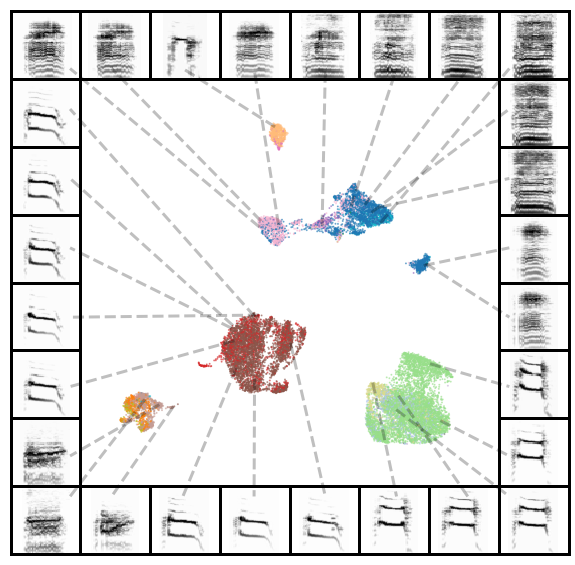

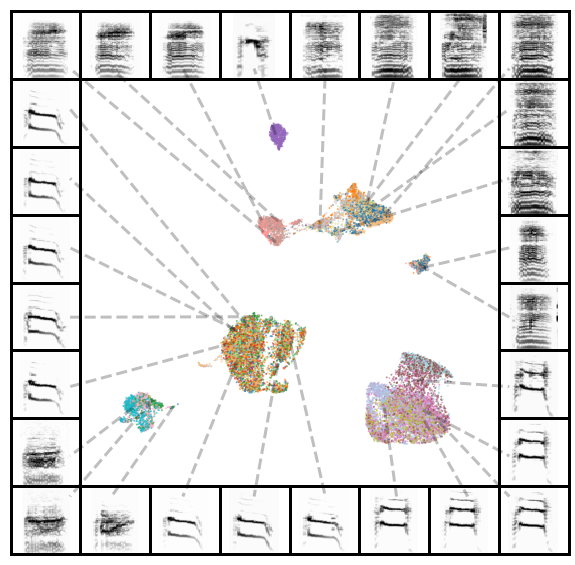

Bird0


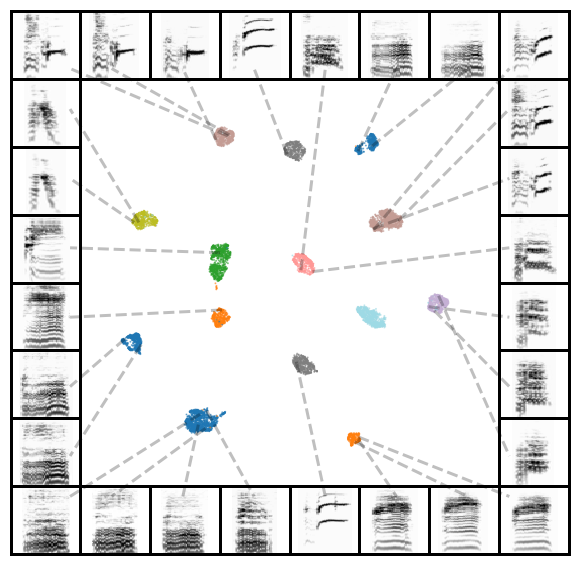

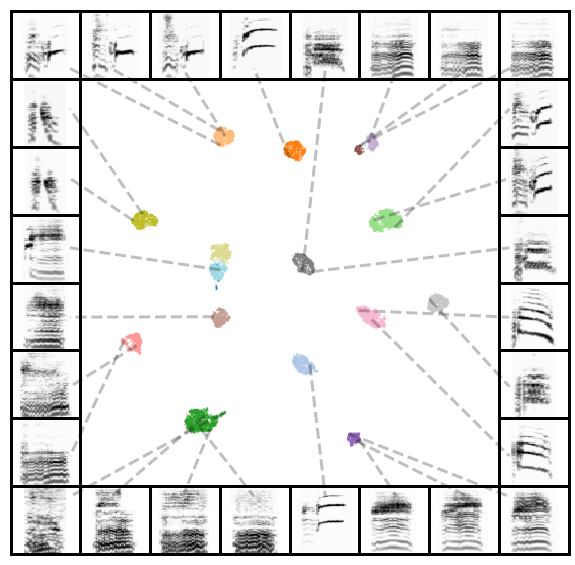

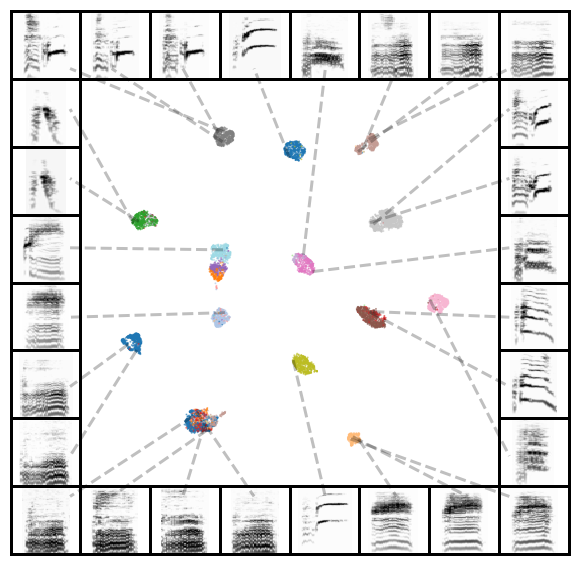

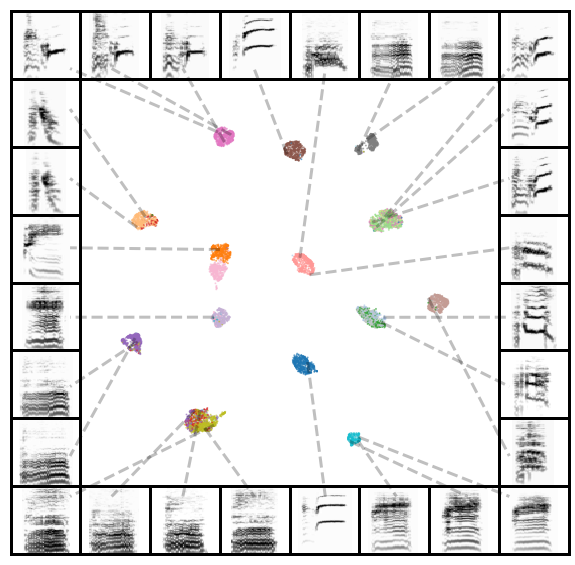

Bird2


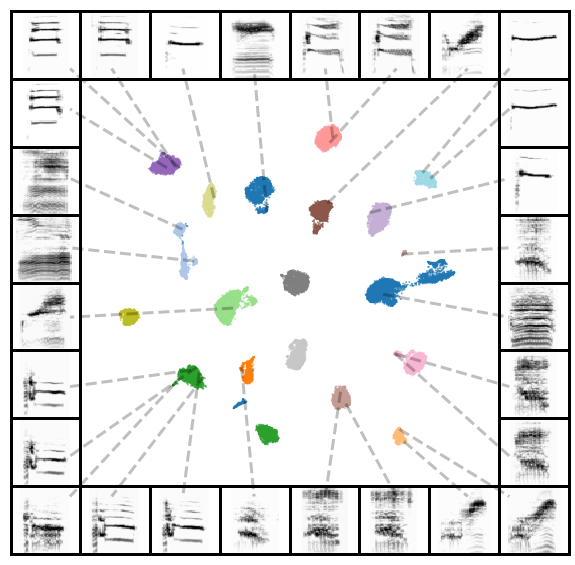

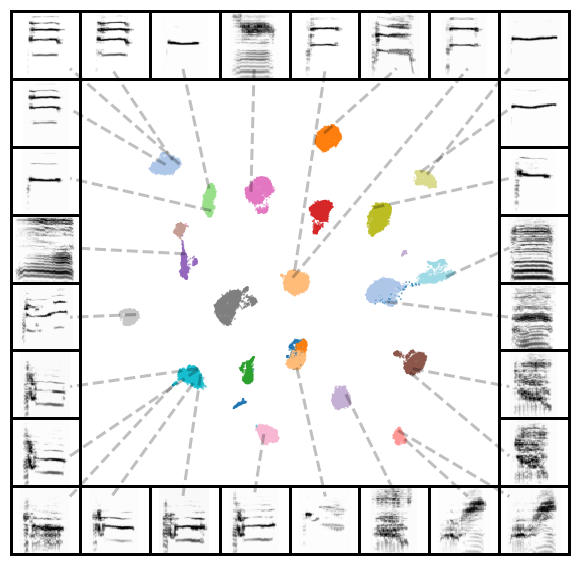

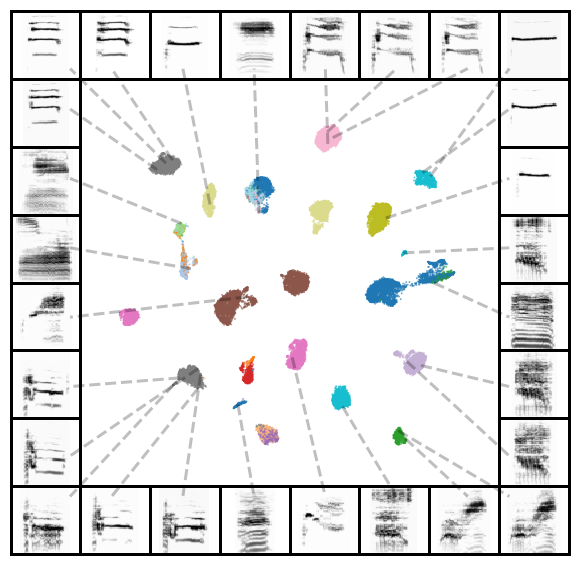

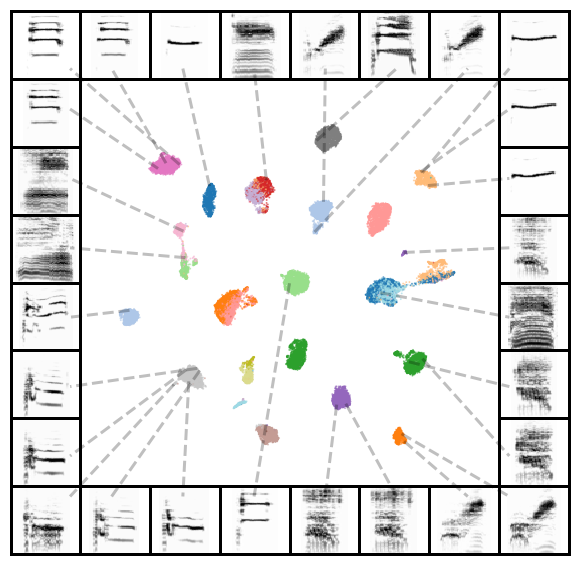

Bird1


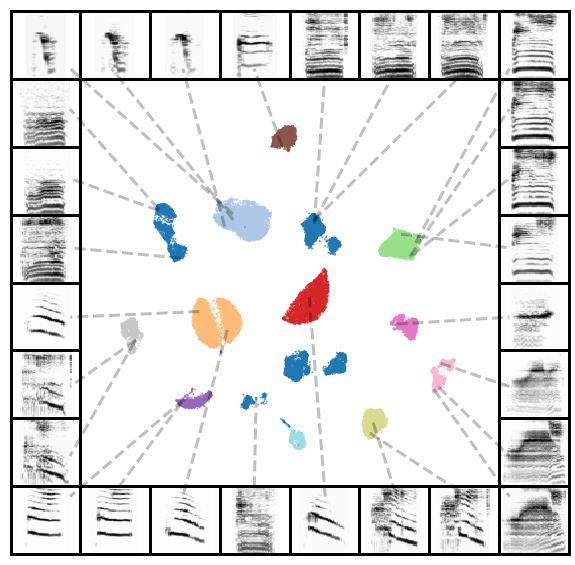

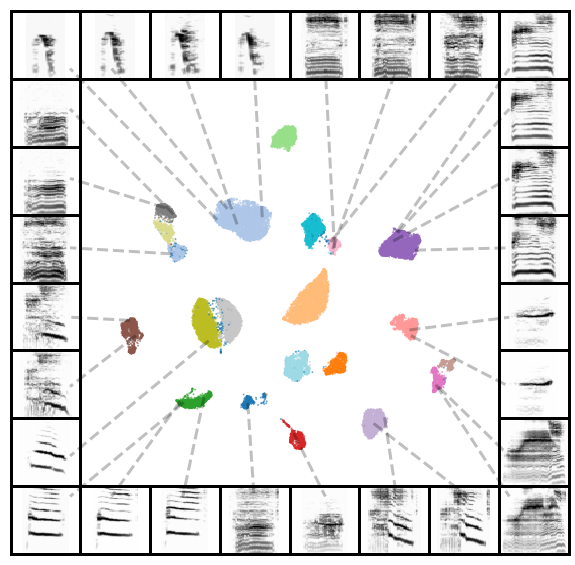

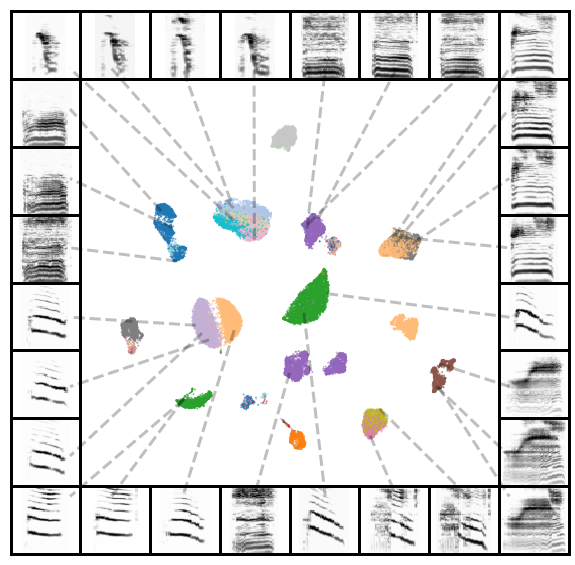

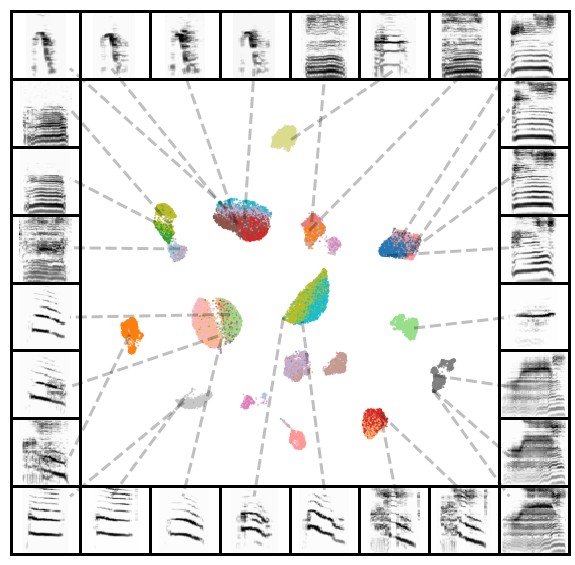

Bird3


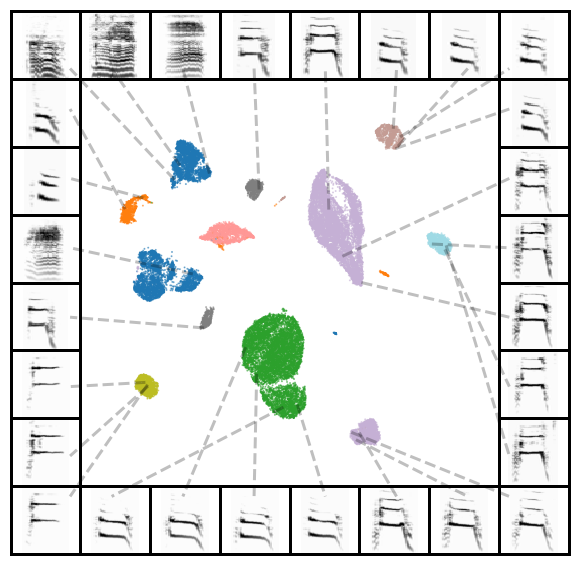

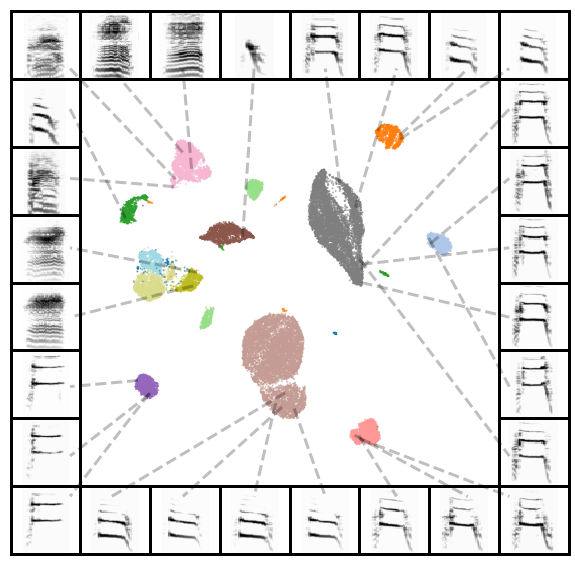

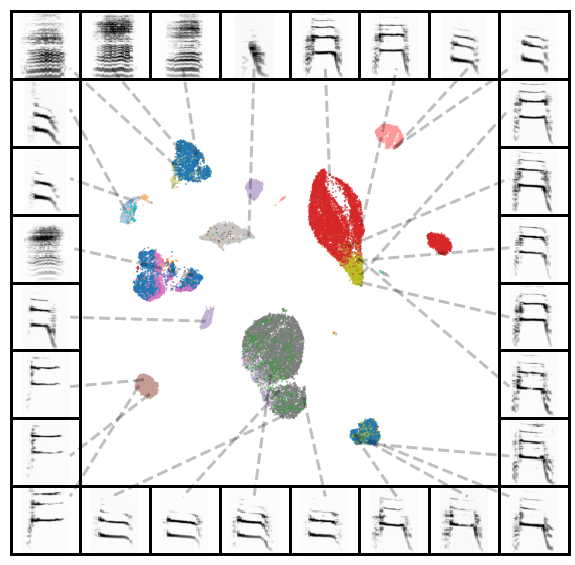

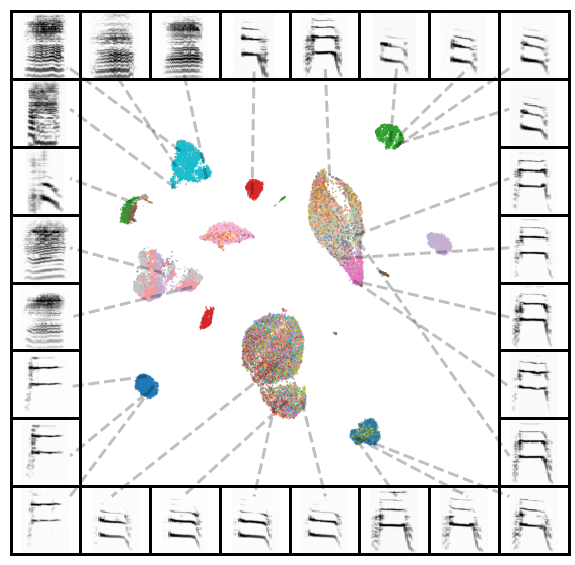

Bird5


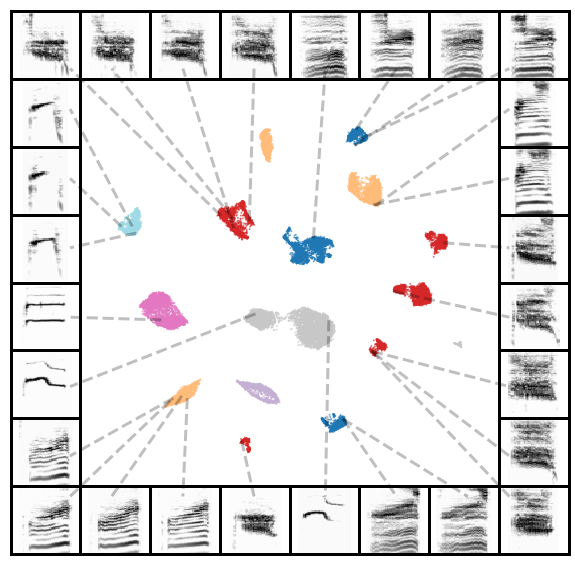

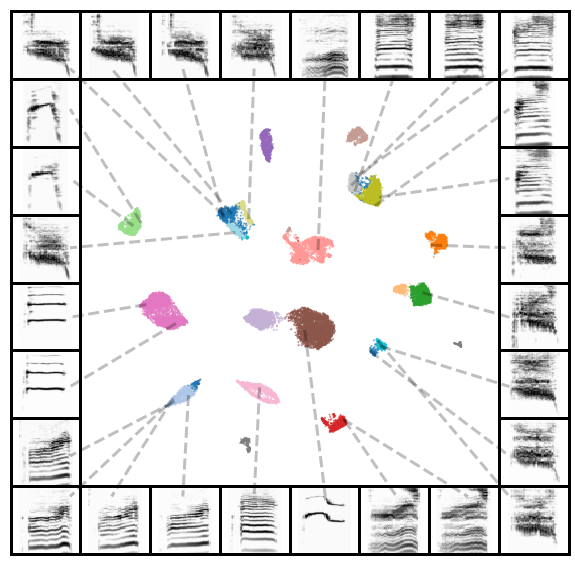

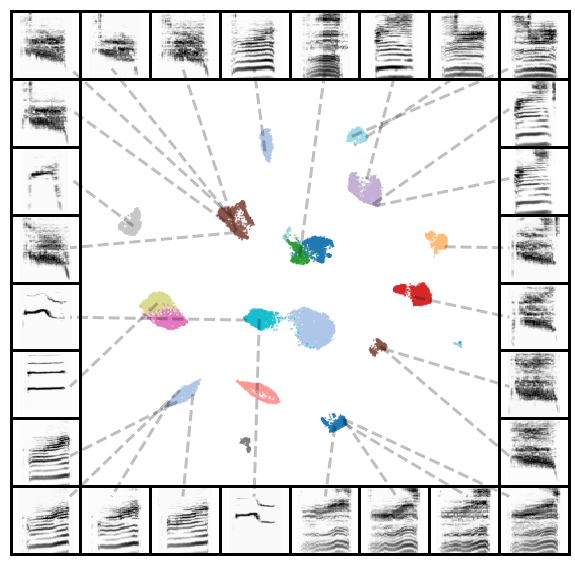

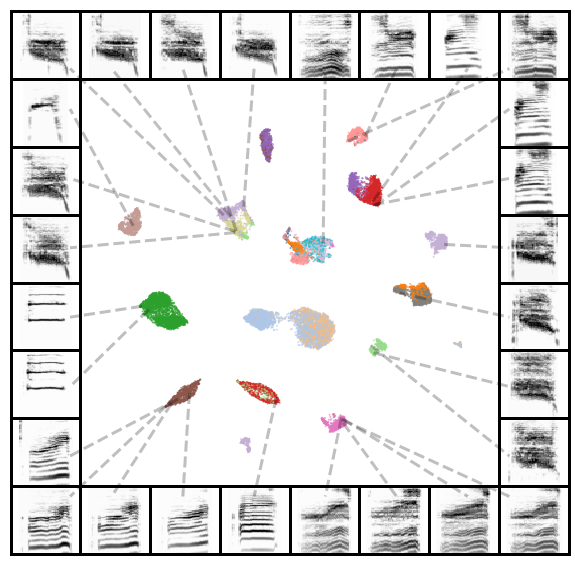

Bird8


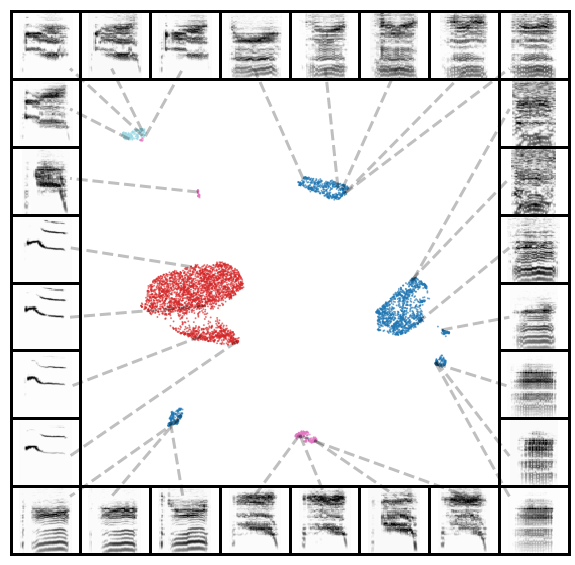

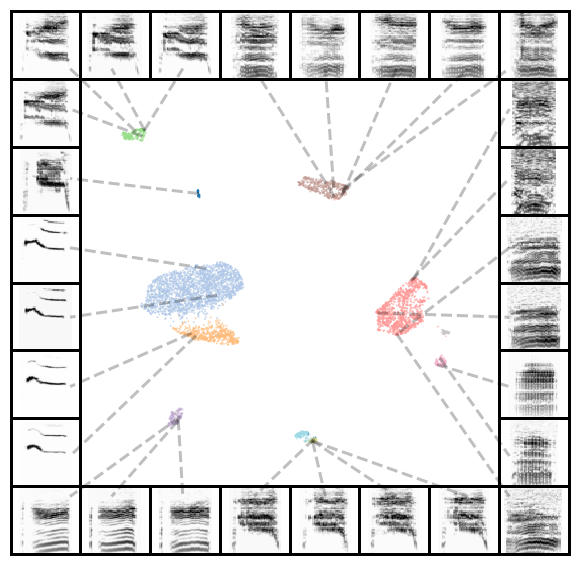

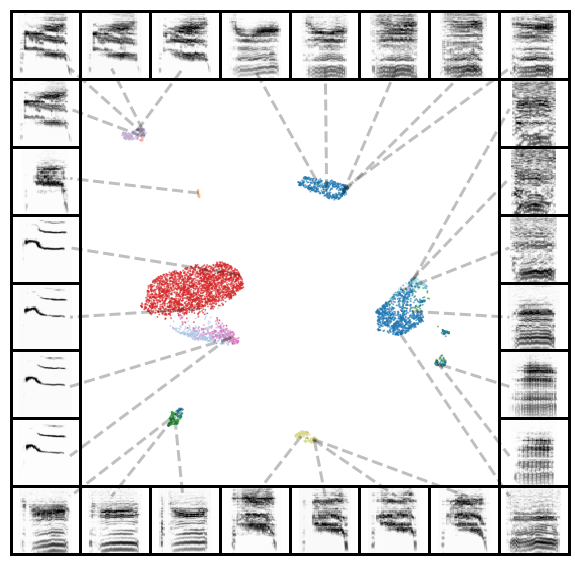

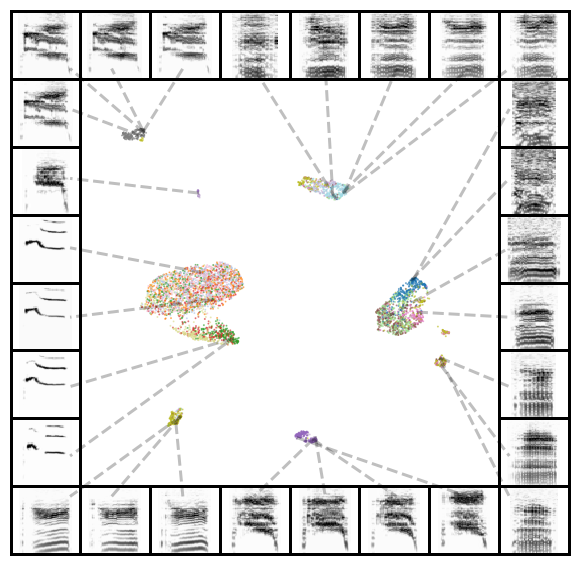

Bird7


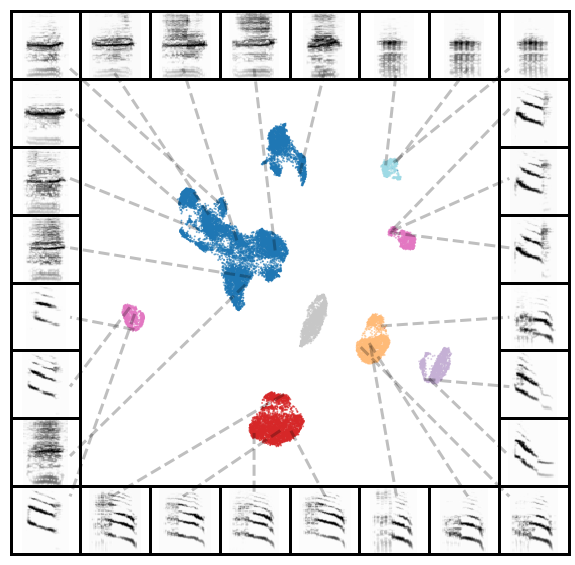

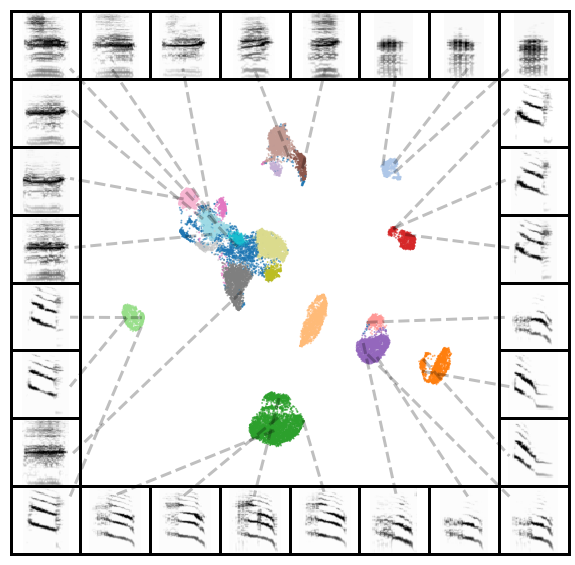

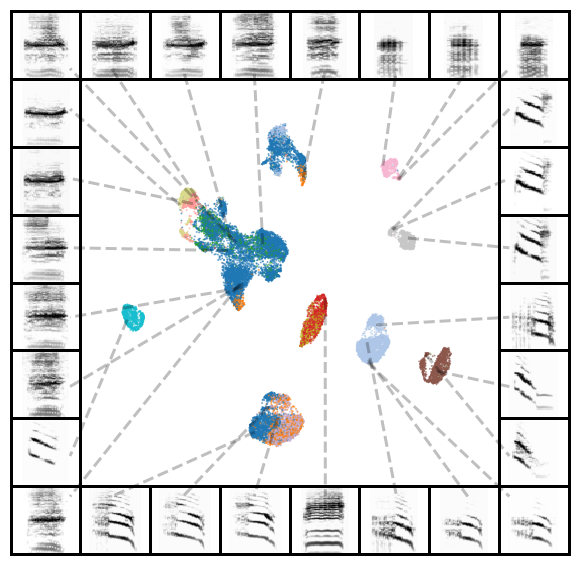

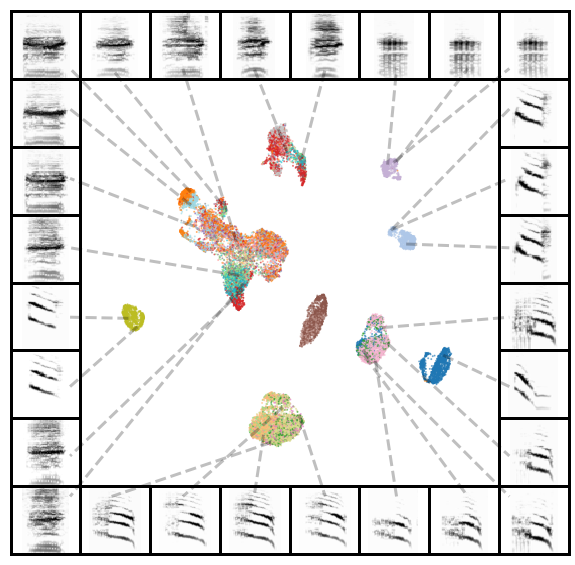

bl26lb16


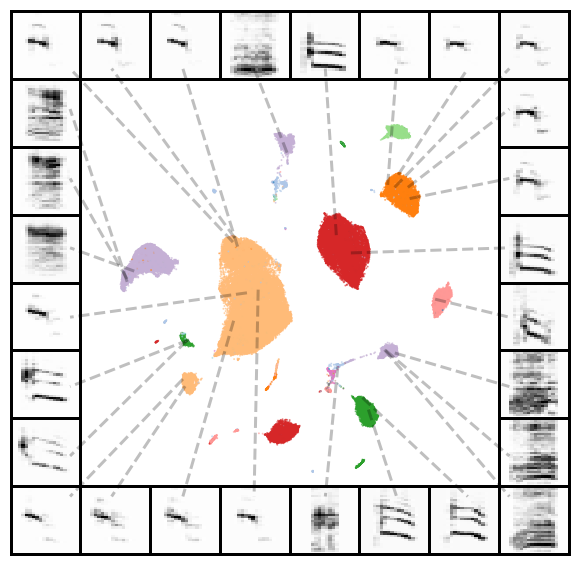

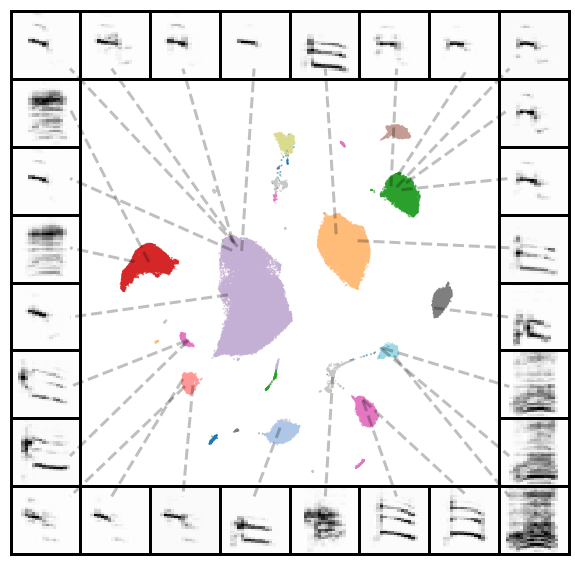

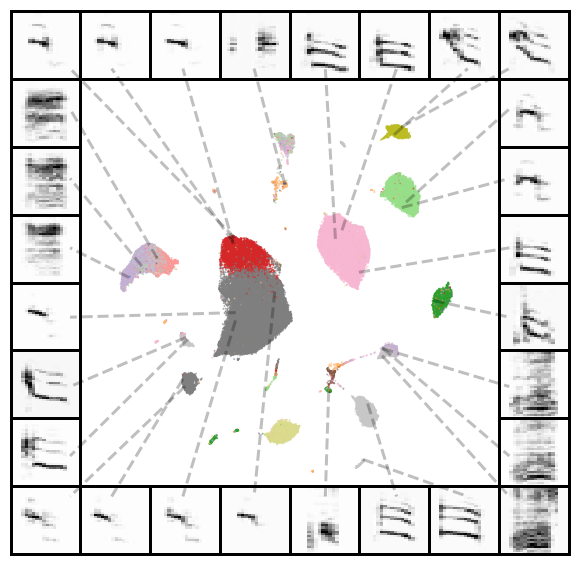

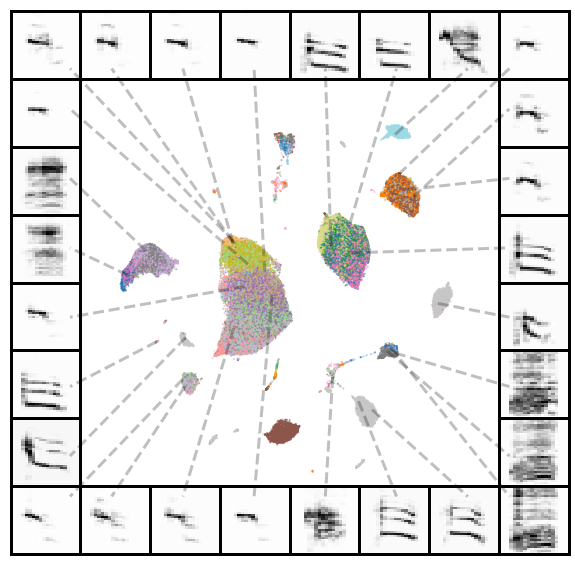

gy6or6


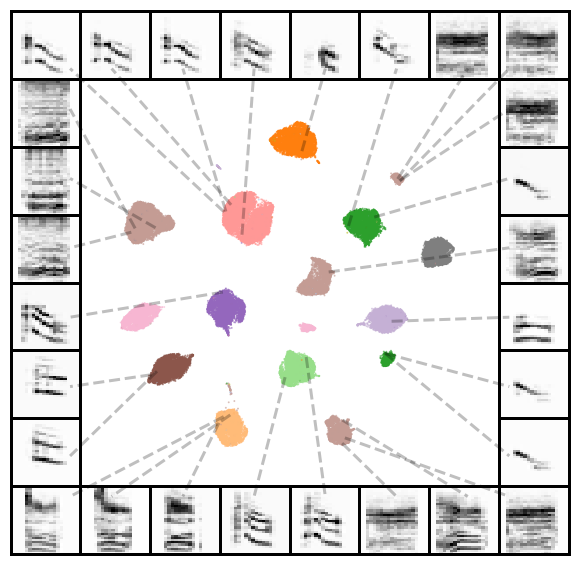

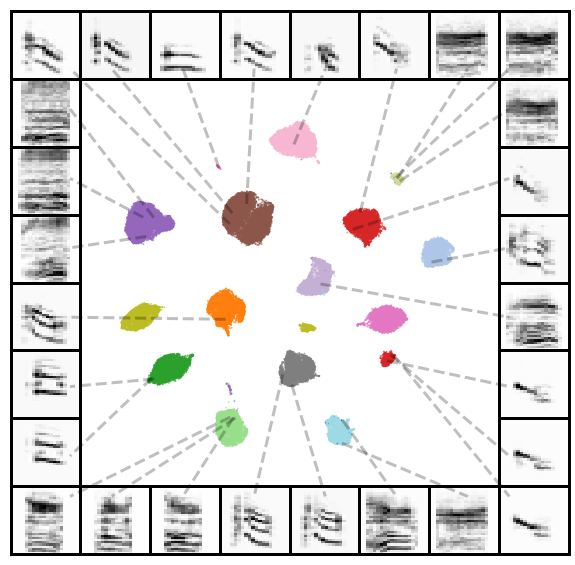

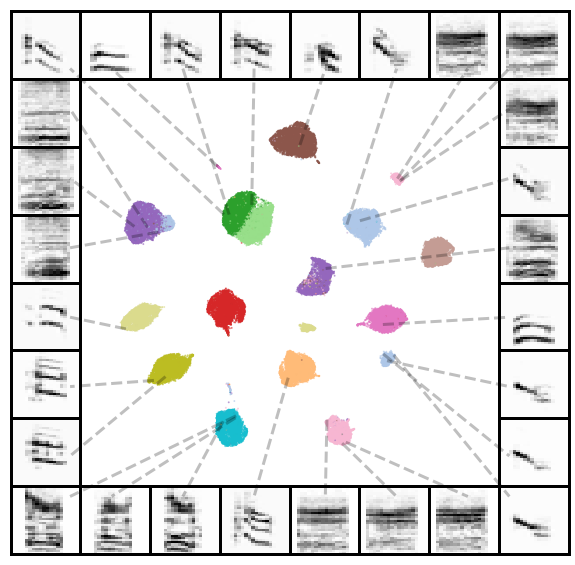

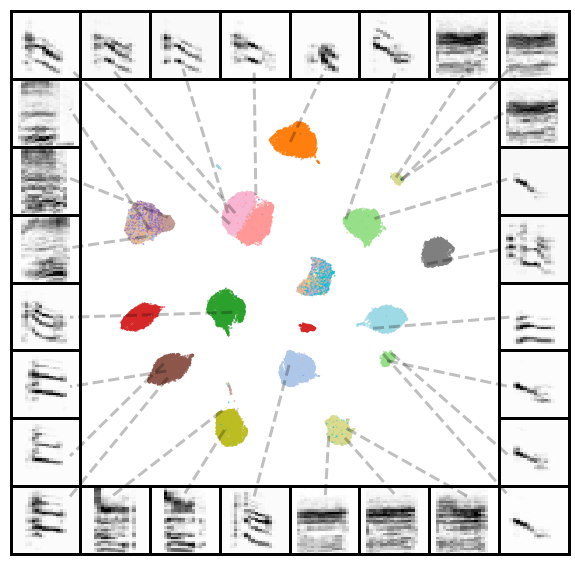

or60yw70


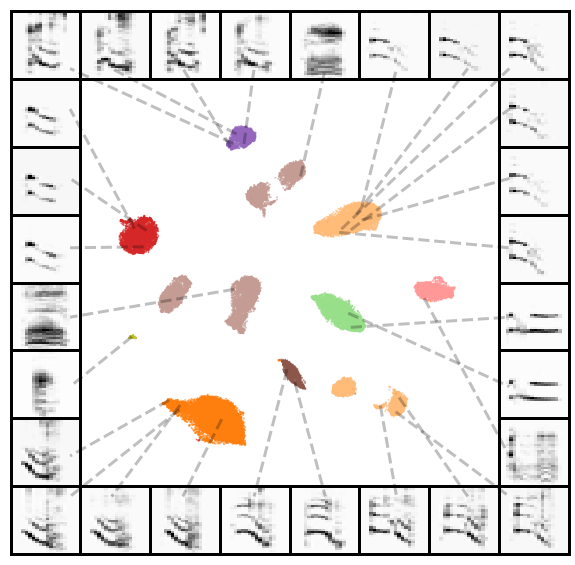

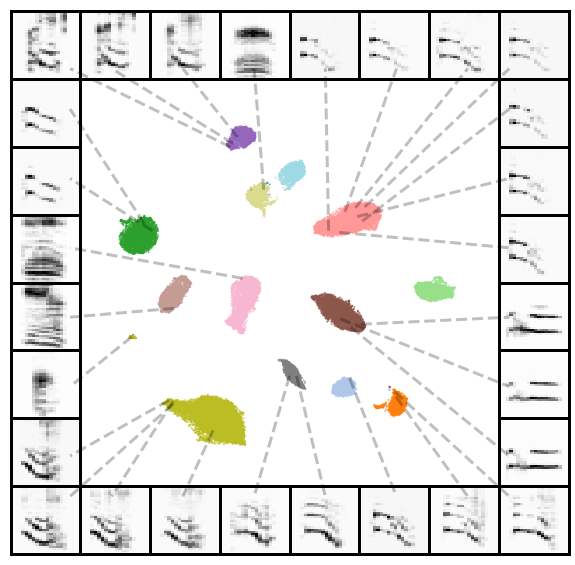

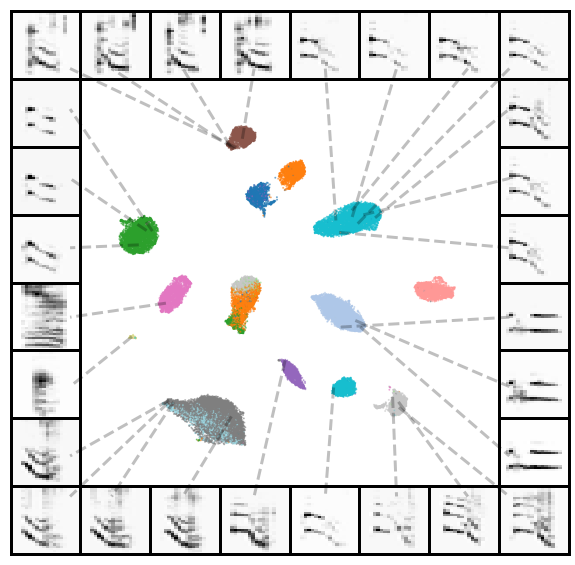

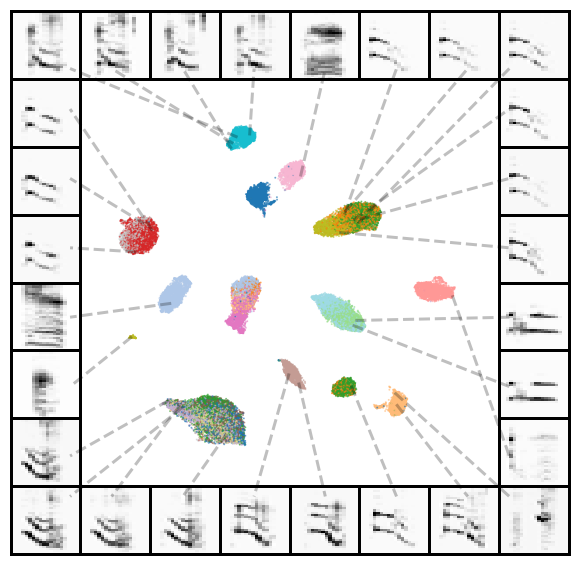

gr41rd51


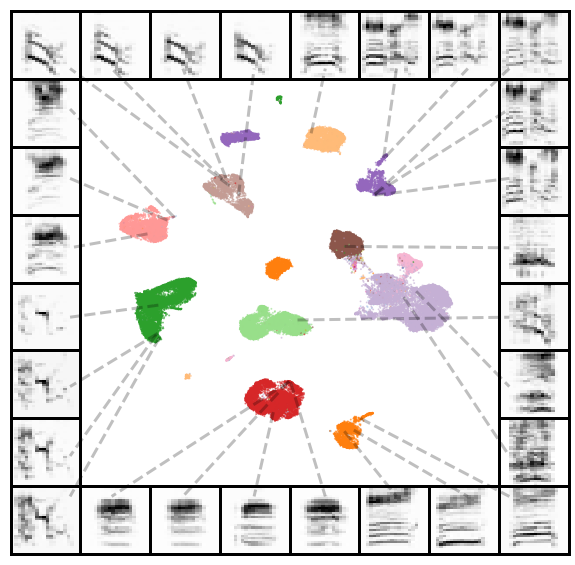

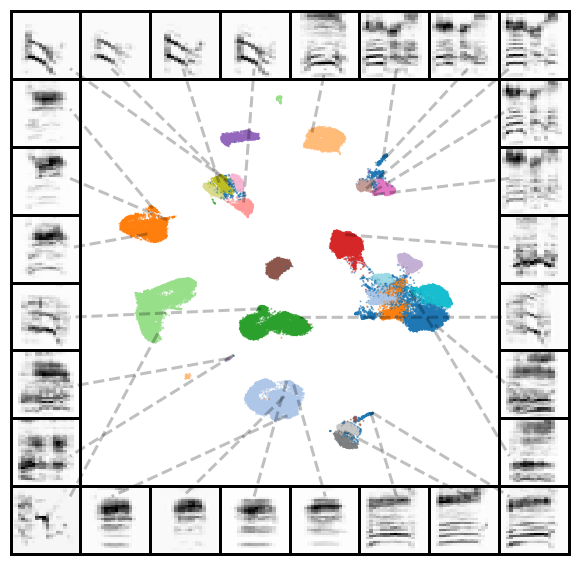

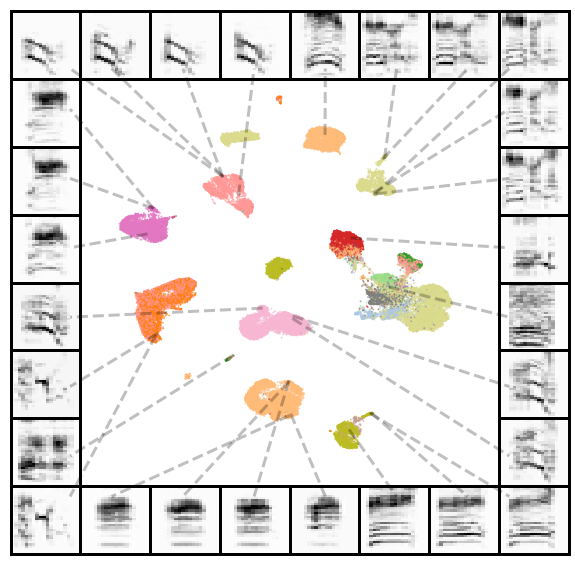

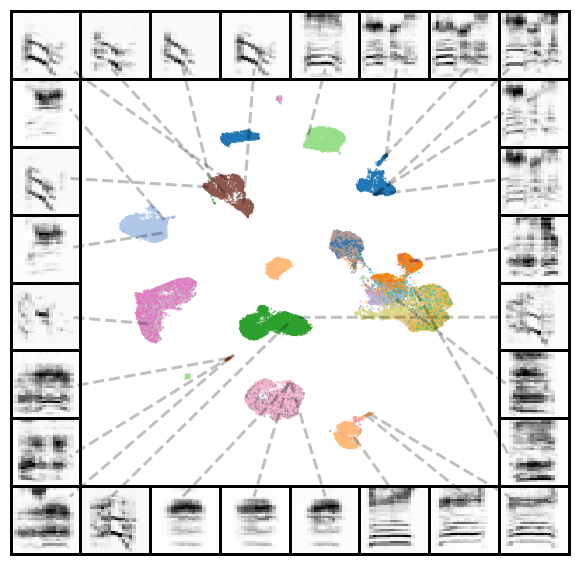

In [28]:
for (indv, dataset) in tqdm(indvs):
    print(indv)
    indv_df = pd.read_pickle(np.array(embeddings_dfs)[np.array([i.stem for i in embeddings_dfs]) == indv][0])
    
    indv_df["hmm_labels"] = np.concatenate(best_fit_HMM[indv]["pom_predictions"])
    
    z = np.vstack(indv_df["umap-0.25"].values)
    
    lab_list = ['labels_num', 'hdbscan_labels_num', 'seqs_second_order_states', 'hmm_labels']
    #fig, axs = plt.subplots(ncols=len(lab_list), figsize=(6*len(lab_list),5))
    for i, lab in enumerate(lab_list):
        
        scatter_spec(
            z,
            indv_df.spectrogram.values,
            column_size=8,
            pal_color="hls",
            color_points=False,
            enlarge_points=0,
            figsize=(10, 10),
            range_pad = 0.15,
            scatter_kwargs = {
                'labels': indv_df[lab],
                'alpha': 0.5,
                's': 1.0,
                'show_legend': False,
                "color_palette": 'tab20',
                "rasterized": True
            },
            matshow_kwargs = {
                'cmap': plt.cm.Greys
            },
            line_kwargs = {
                'lw':3,
                'ls':"dashed",
                'alpha':0.25,
            },
            draw_lines=True,
            n_subset= 1000,
            border_line_width = 3,

        );
        
        
        if True:
            save_loc = FIGURE_DIR / 'bf_sequential_clusters' 
            ensure_dir(save_loc)
            #save_fig(save_loc / (indv + '_' + lab), dpi=300, save_pdf=True)

        plt.show()
    

### Save for paper

In [76]:
results_df[:3]

,indv,dataset,AIC,BIC,LL,model_type,model,n_params,n_components,n_data,norm_LL,norm_AIC,norm_BIC
0,Bird9,koumura_bengalese_finch,23368.446449,23683.657253,-11644.223224,FOMM,"None:{\n ""class"" : ""State"",\n ""distribut...",40,6,19541,-4260.947944,7453.895888,3245.831653
1,Bird9,koumura_bengalese_finch,22833.080314,25677.857821,-11055.540157,HDBSCAN,"None:{\n ""class"" : ""State"",\n ""distribut...",361,17,19541,-3672.264876,6918.529753,5240.032221
2,Bird4,koumura_bengalese_finch,32020.121853,32323.505089,-15973.060926,FOMM,"None:{\n ""class"" : ""State"",\n ""distribut...",37,5,26891,-1270.757364,2002.848061,-205.563247


In [77]:
ensure_dir(DATA_DIR / "paper_data" / "HMM_bengalese_finch" )
results_df.to_pickle(DATA_DIR / "paper_data" / "HMM_bengalese_finch" / "fit_HMM_models.pickle")

In [78]:
pd.__version__

'0.25.3'